# Part 1 | Visualizing Economic Data

## Part 1.7 | Exploring Relationships

In [115]:
from Weidman_Figures import *

beans = pd.read_csv('Data/Part_1_7_Coffee_Bean_Production.csv')#, index_col=0)
beans = beans.dropna(subset=['Code'])
beans = beans.rename(columns={'Coffee, green | 00000656 || Production | 005510 || tonnes': 'Tonnes'})
beans = beans.drop(columns=['Entity'])

gdp = pd.read_csv('Data/Part_1_7_GDP.csv')#, index_col=0)
gdp = gdp.rename(columns={'GDP (output, multiple price benchmarks)': 'GDP'})

data = pd.merge(beans, gdp, on=['Code', 'Year'], how='inner')
data['GDP'] = data['GDP']/1_000_000_000_000
data['Tonnes'] = data['Tonnes']/1000000
data = data[data.Entity != 'World']
data = data[data.Tonnes > 0.01]
data = data[data.GDP < 9]
data.to_csv('Data/Part_1_7_Beans_GDP.csv')

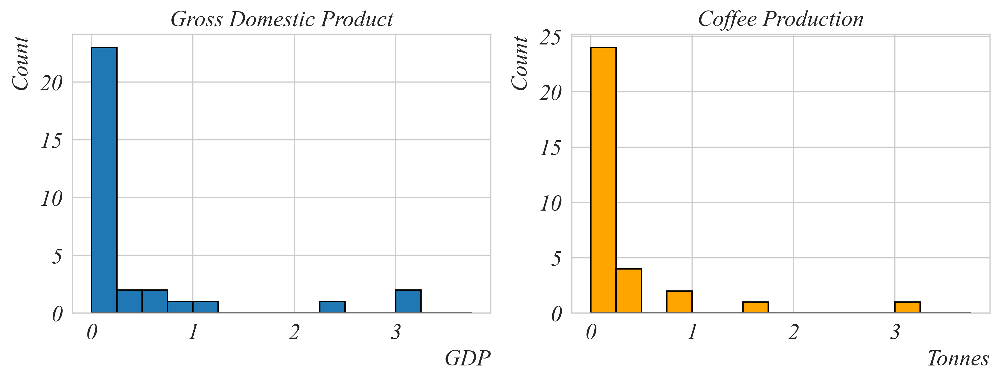

In [1]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(widths=[1,1], height=4)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

bin_edges = np.arange(0, 4, 1/4)

ax[0].hist(data['GDP'], bins=bin_edges, edgecolor='black')
ax[0].set_xlabel('GDP', loc='right')
ax[0].set_ylabel('Count')
ax[0].yaxis.set_label_coords(-0.1, 0.90)
ax[0].set_title('Gross Domestic Product')

ax[1].hist(data['Tonnes'], bins=bin_edges, edgecolor='black', color='orange')
ax[1].set_xlabel('Tonnes', loc='right')
ax[1].set_ylabel('Count')
ax[1].yaxis.set_label_coords(-0.1, 0.90)
ax[1].set_title('Coffee Production')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_GDP_Coffee_Hists.png')
plt.show()

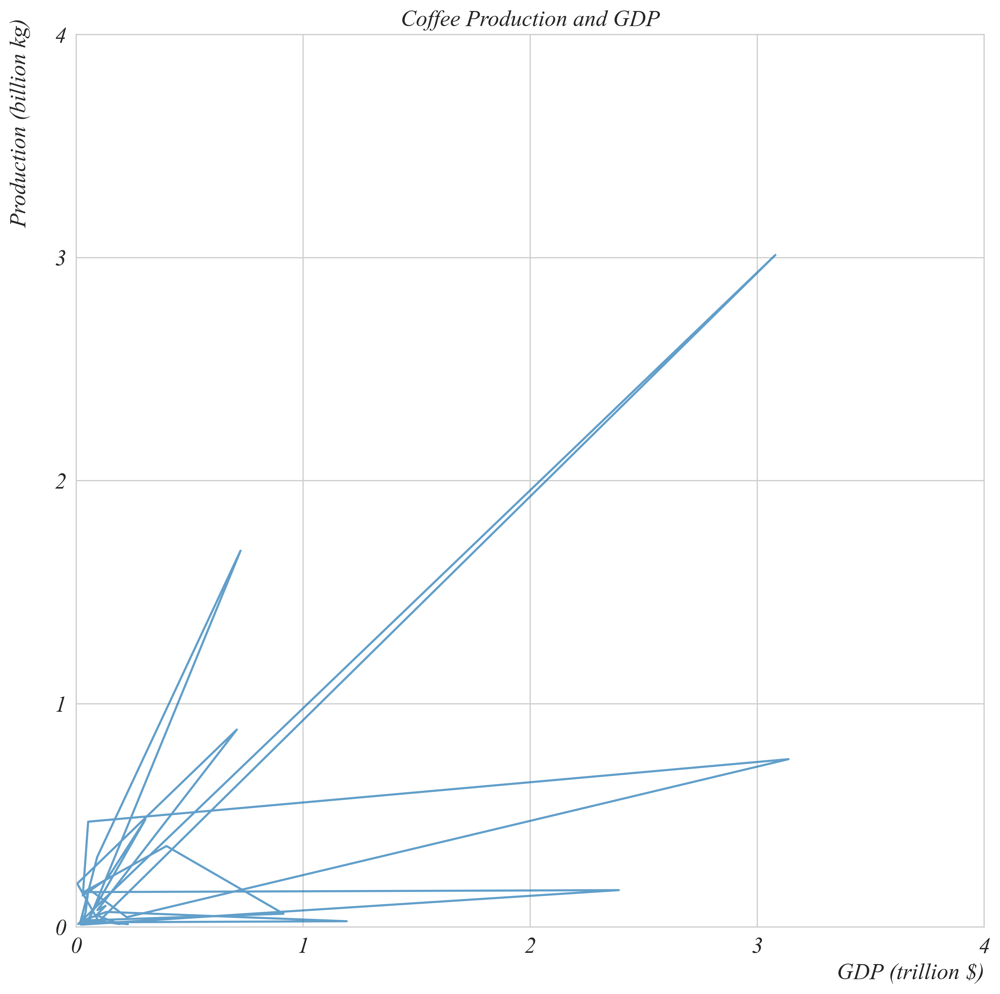

In [2]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

plt.plot(data['GDP'], data['Tonnes'], alpha=0.7)

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Line.png')

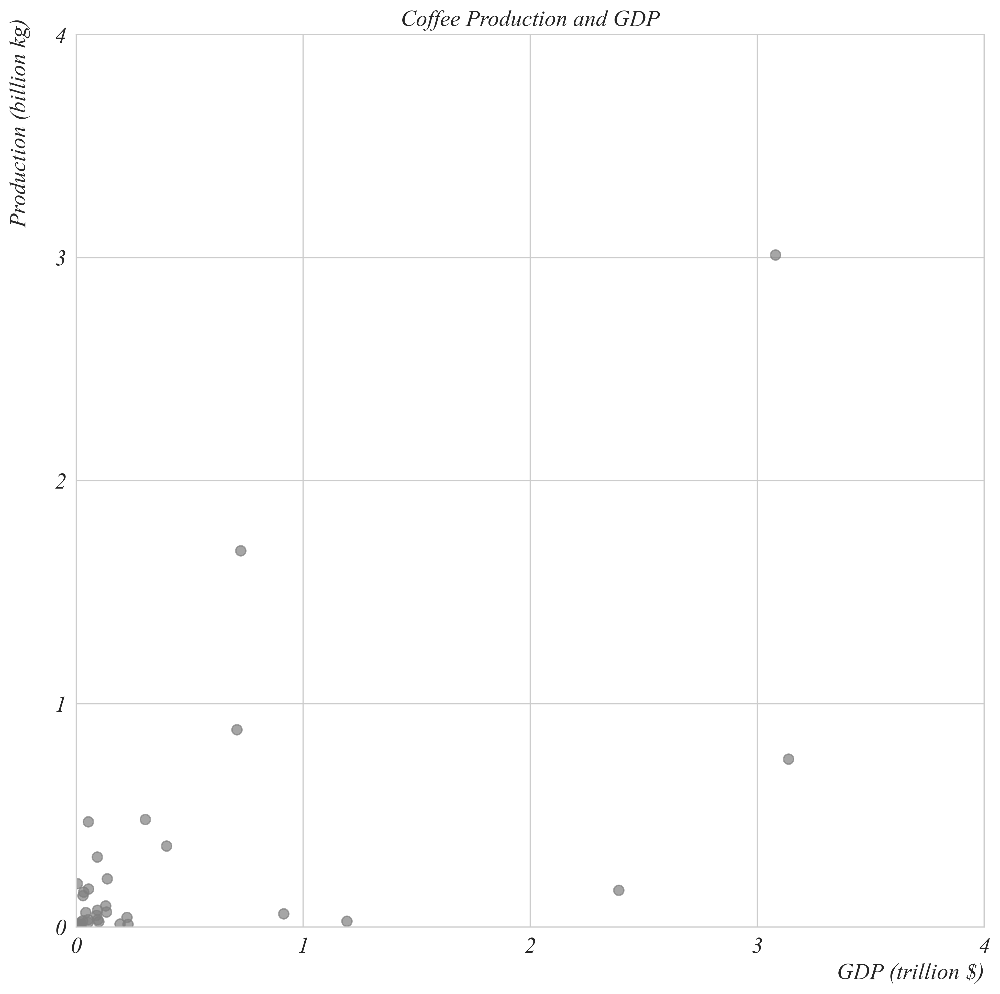

In [3]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
#print(data.head())

plt.scatter(data['GDP'], data['Tonnes'], color='grey', edgecolors='grey', alpha=0.7, s=50)

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter.png')

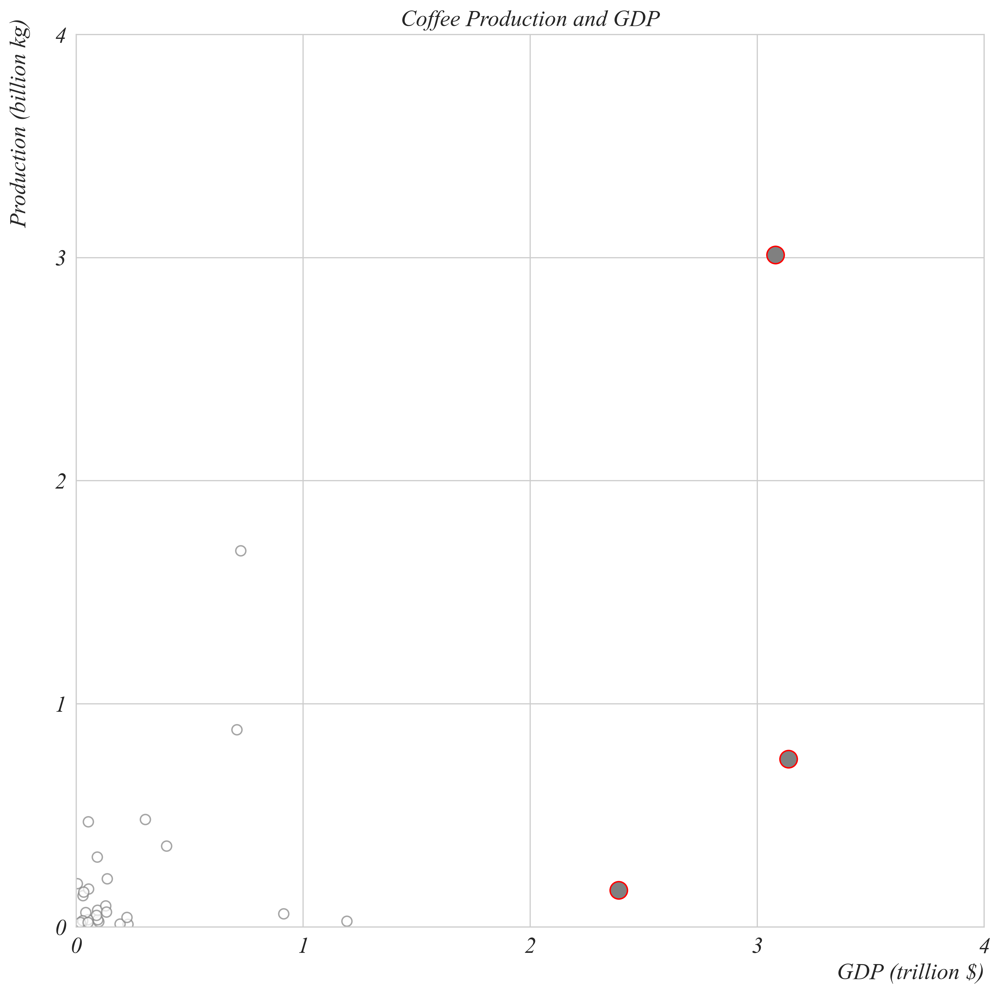

In [123]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
#print(data.head())

plt.scatter(data['GDP'], data['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)

high_gdp = data[data.GDP > 2]
plt.scatter(high_gdp['GDP'], high_gdp['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_High_GDP.png')

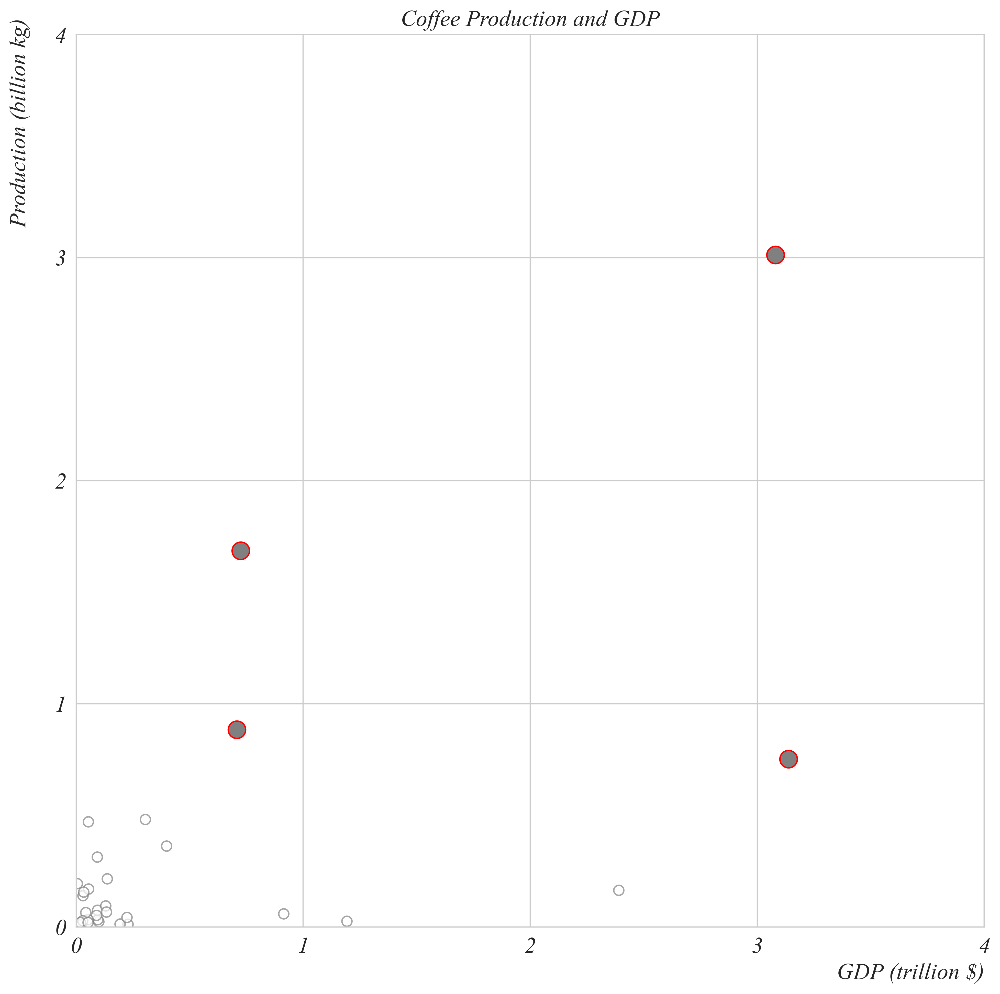

In [124]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

plt.scatter(data['GDP'], data['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)

high_production = data[data.Tonnes > 0.5]
plt.scatter(high_production['GDP'], high_production['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_High_Production.png')

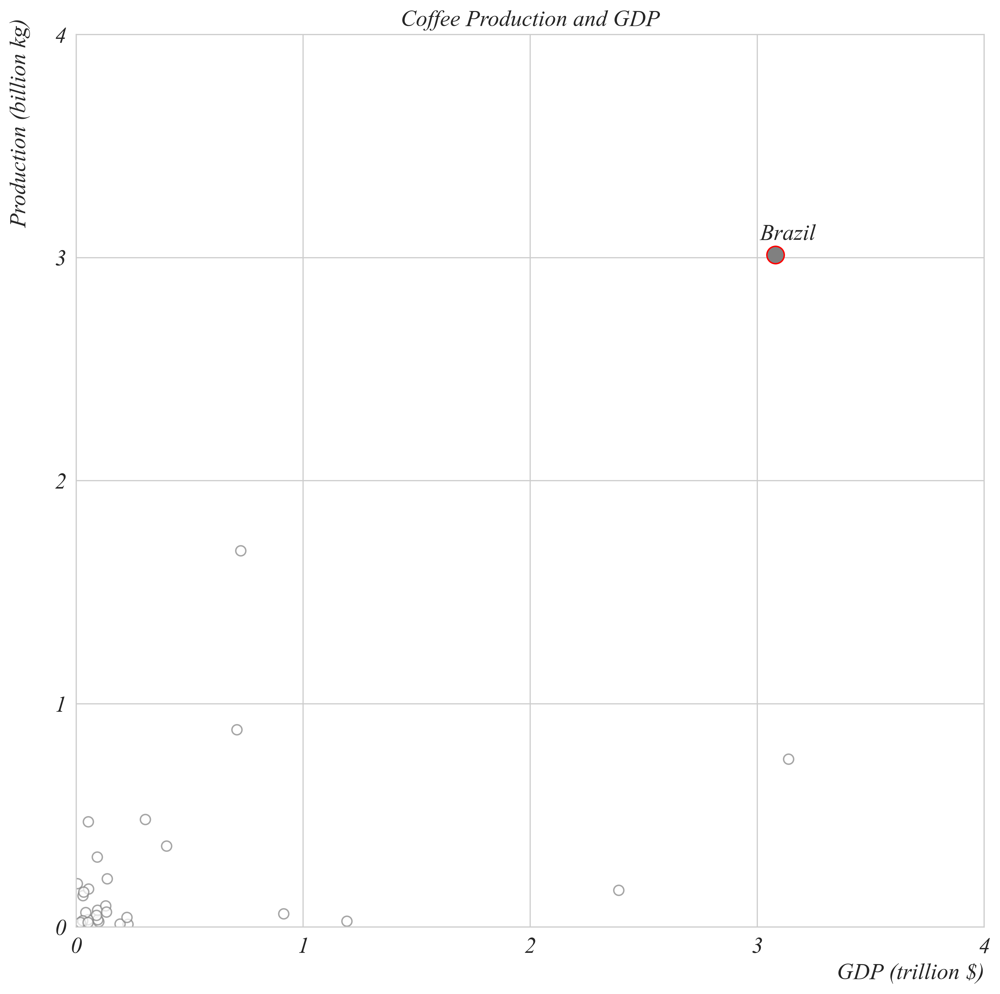

In [125]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

plt.scatter(data['GDP'], data['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)

brazil = data[data.Tonnes == data.Tonnes.max()]
plt.scatter(brazil['GDP'], brazil['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)
plt.annotate('Brazil',(brazil.Tonnes.values[0], brazil.GDP.values[0]))

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Brazil_No_Line.png')

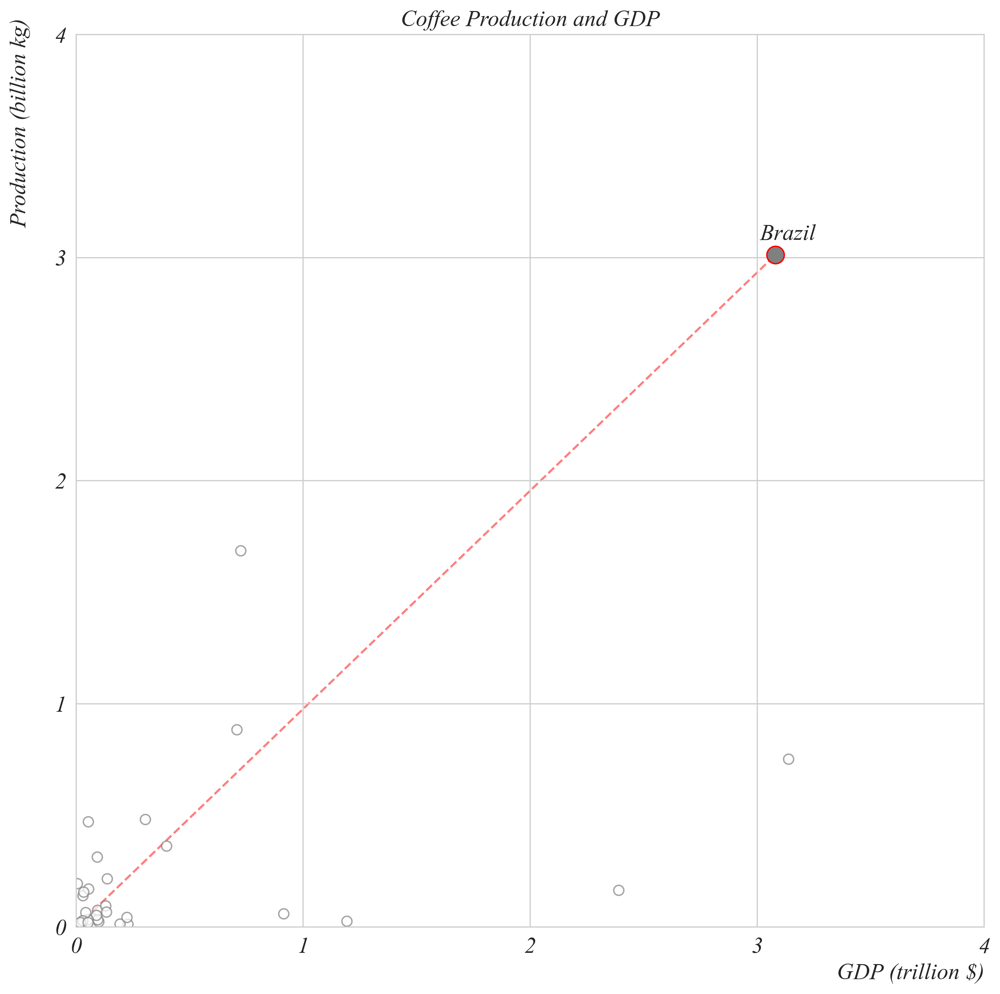

In [126]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

plt.scatter(data['GDP'], data['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)

brazil = data[data.Tonnes == data.Tonnes.max()]
plt.scatter(brazil['GDP'], brazil['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)
plt.plot([0,brazil.GDP.values[0]],[0,brazil.Tonnes.values[0]], linestyle='--', color='red', zorder=-1, alpha=0.5)
plt.annotate('Brazil',(brazil.Tonnes.values[0], brazil.GDP.values[0]))

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Brazil.png')

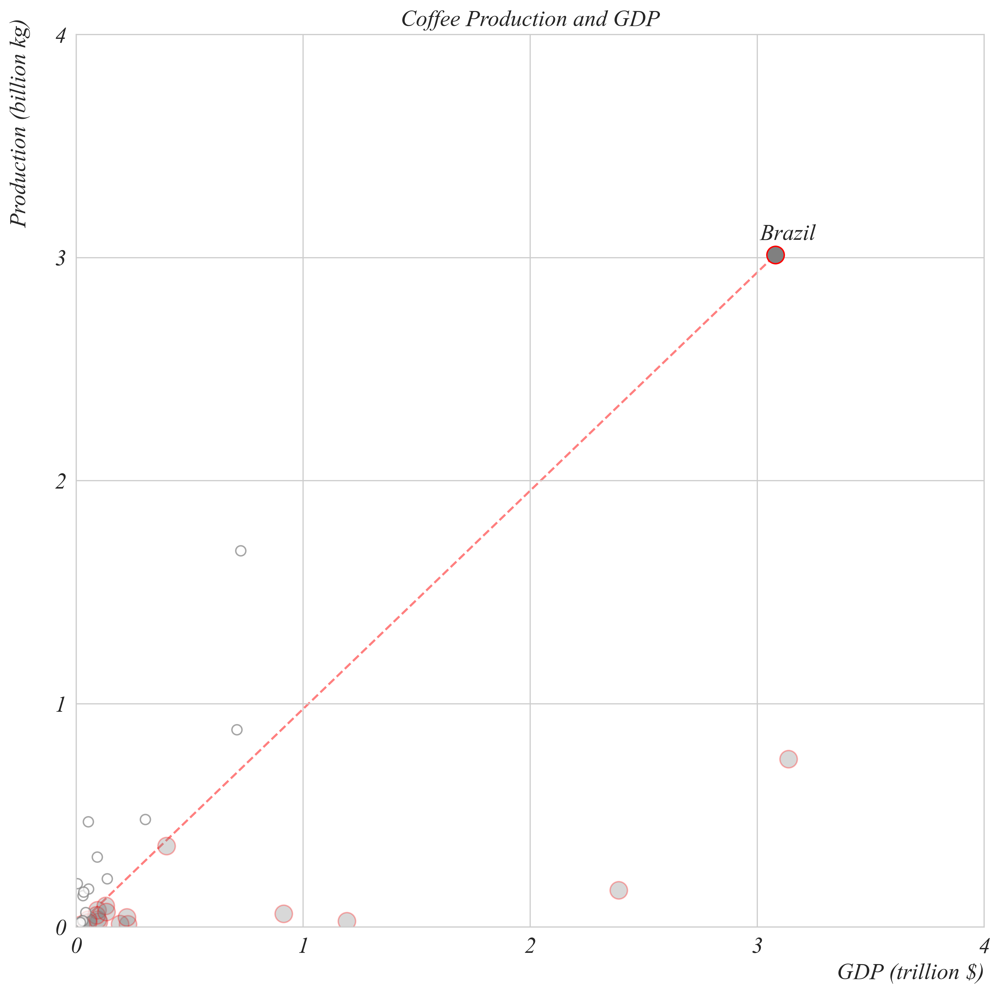

In [127]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

brazil = data[data.Tonnes == data.Tonnes.max()]
brazil_gdp = brazil.GDP.values[0]
brazil_tonnes = brazil.Tonnes.values[0]
plt.scatter(brazil['GDP'], brazil['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)
plt.plot([0,brazil_gdp],[0,brazil_tonnes], linestyle='--', color='red', zorder=-1, alpha=0.5)

data['brazil_ratio'] = data['GDP']/data['Tonnes']
greater = data[data['brazil_ratio'] > brazil_gdp/brazil_tonnes]
lower = data[data['brazil_ratio'] < brazil_gdp/brazil_tonnes]

plt.scatter(greater['GDP'], greater['Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)
plt.scatter(lower['GDP'], lower['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)

plt.annotate('Brazil',(brazil.Tonnes.values[0], brazil.GDP.values[0]))

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Brazil_Greater.png')

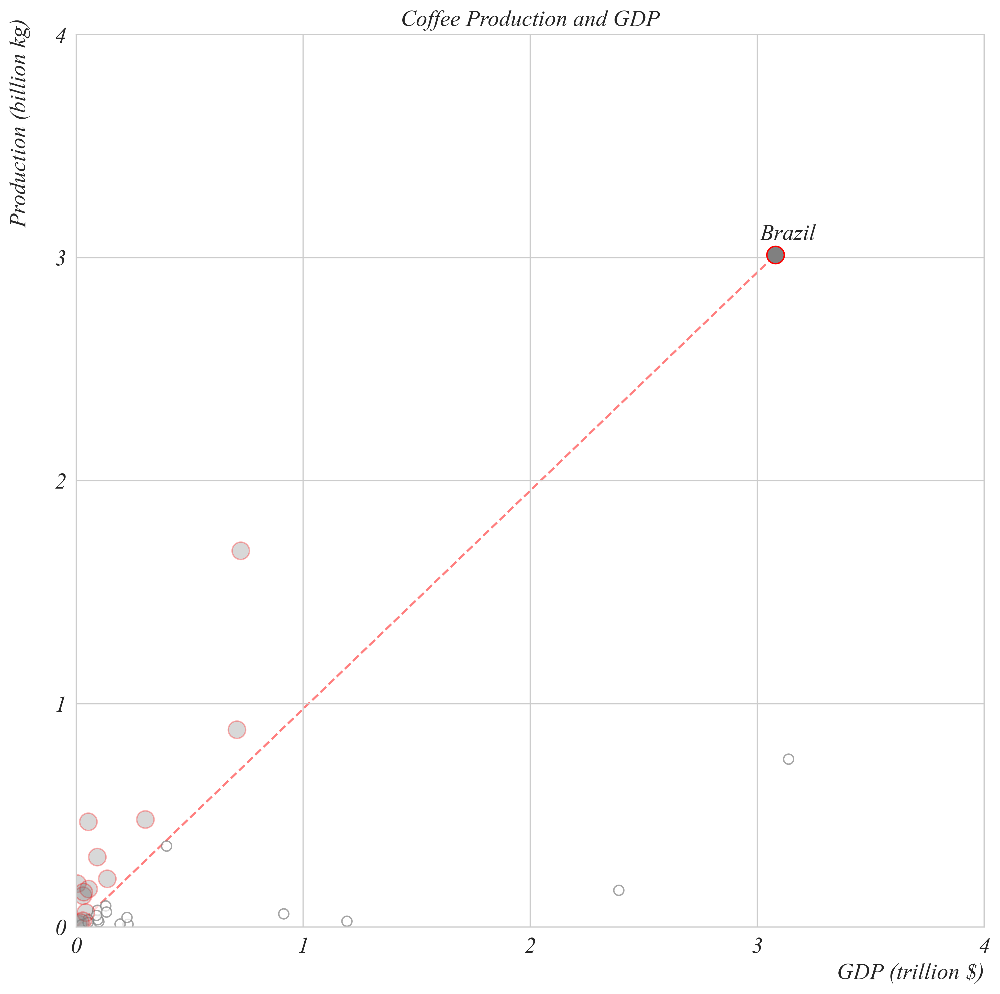

In [128]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]

brazil = data[data.Tonnes == data.Tonnes.max()]
brazil_gdp = brazil.GDP.values[0]
brazil_tonnes = brazil.Tonnes.values[0]
plt.scatter(brazil['GDP'], brazil['Tonnes'], color='grey', edgecolors='red', alpha=1, s=150)
plt.plot([0,brazil_gdp],[0,brazil_tonnes], linestyle='--', color='red', zorder=-1, alpha=0.5)

data['brazil_ratio'] = data['GDP']/data['Tonnes']
greater = data[data['brazil_ratio'] > brazil_gdp/brazil_tonnes]
lower = data[data['brazil_ratio'] < brazil_gdp/brazil_tonnes]

plt.scatter(greater['GDP'], greater['Tonnes'], color='white', edgecolors='grey', alpha=0.7, s=50)
plt.scatter(lower['GDP'], lower['Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

plt.annotate('Brazil',(brazil.Tonnes.values[0], brazil.GDP.values[0]))

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Brazil_Lower.png')

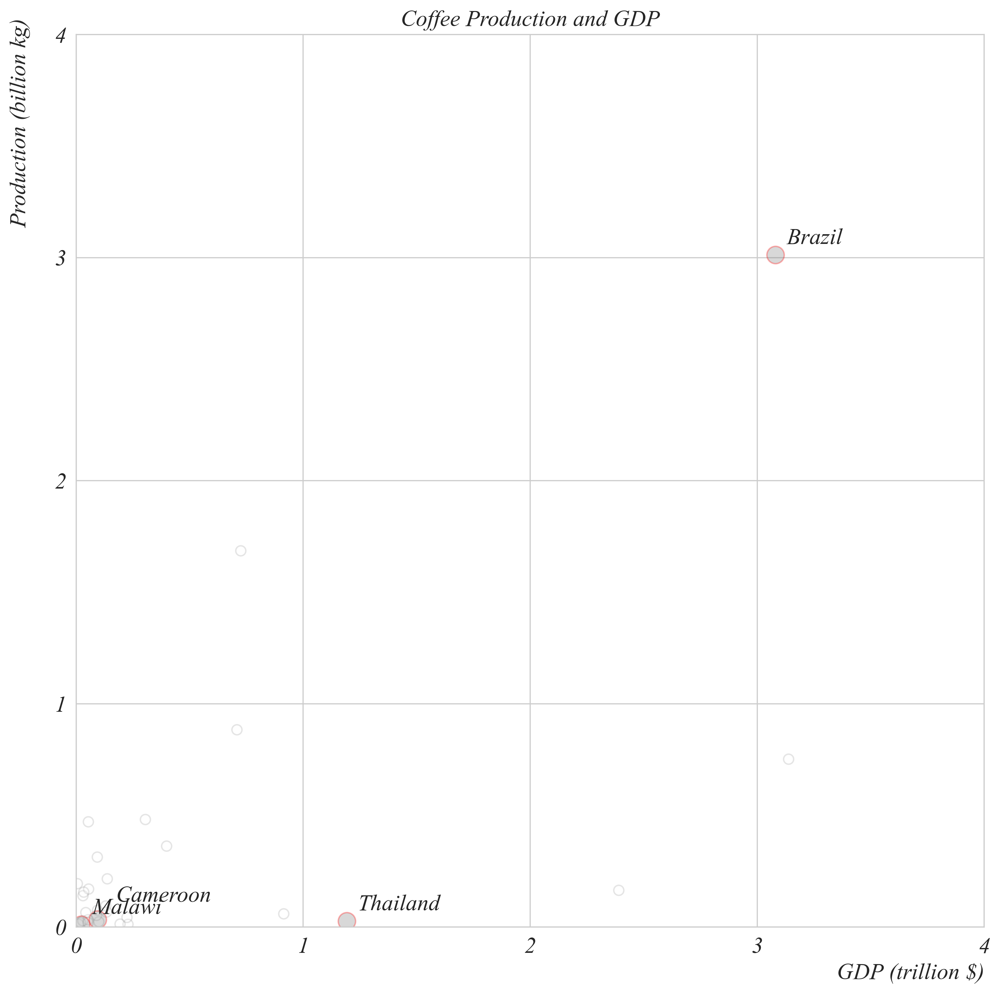

In [129]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

subset_list = ['BRA', 'THA', 'MWI', 'CMR']

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
other_data = data[~data.Code.isin(subset_list)]

plt.scatter(other_data['GDP'], other_data['Tonnes'], color='white', edgecolors='grey', alpha=0.2, s=50)

subset = data[data.Code.isin(subset_list)]

plt.scatter(subset['GDP'], subset['Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

for index, row in subset.iterrows():
    row_gdp = row.GDP
    row_tonnes = row.Tonnes
    row_entity = row.Entity
    if row_entity != 'Cameroon':
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))
    else:
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.08, row_tonnes+0.08))

plt.xlabel('GDP (trillion $)', loc='right')
plt.xticks([0,1,2,3,4])
plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Subset.png')

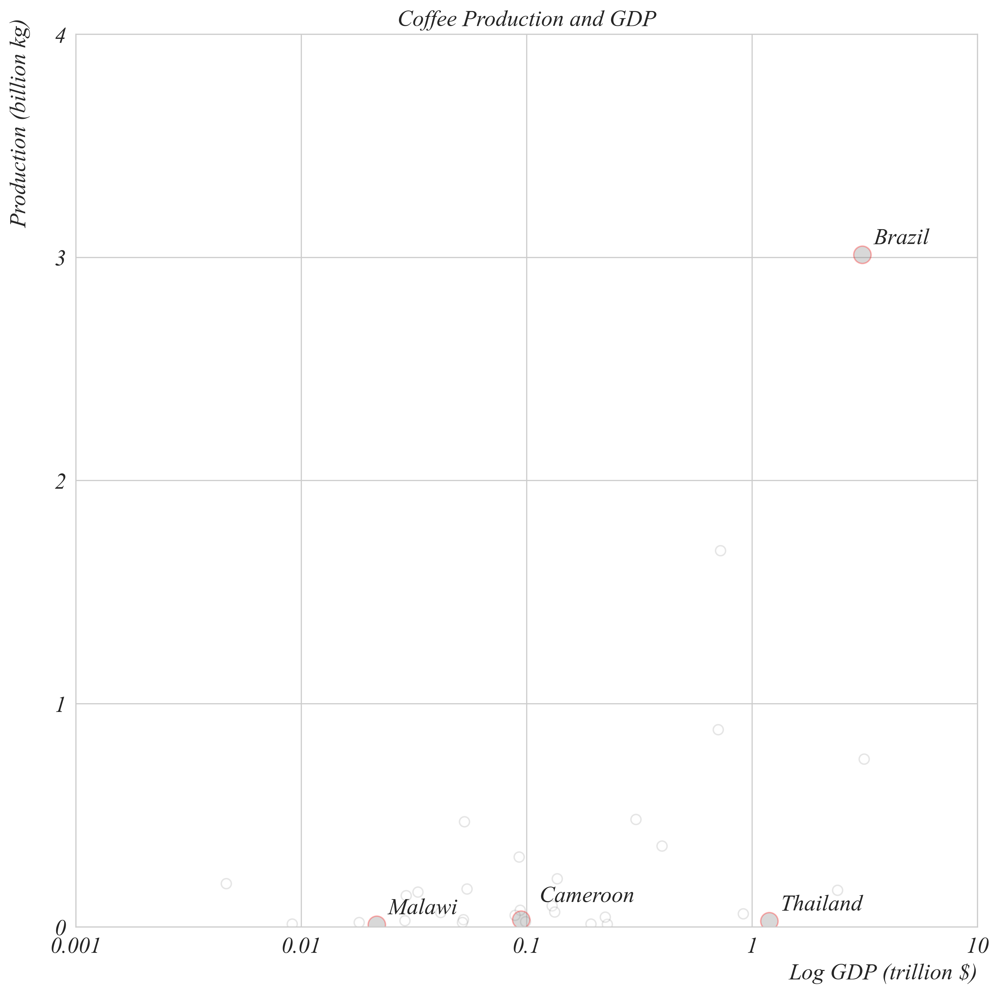

In [130]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

subset_list = ['BRA', 'THA', 'MWI', 'CMR']

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)

other_data = data[~data.Code.isin(subset_list)]

plt.scatter(other_data['log10_GDP'], other_data['Tonnes'], color='white', edgecolors='grey', alpha=0.2, s=50)

subset = data[data.Code.isin(subset_list)]

plt.scatter(subset['log10_GDP'], subset['Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

for index, row in subset.iterrows():
    row_gdp = row.log10_GDP
    row_tonnes = row.Tonnes
    row_entity = row.Entity
    if row_entity != 'Cameroon':
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))
    else:
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.08, row_tonnes+0.08))

plt.xlabel('Log GDP (trillion $)', loc='right')
x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
#plt.xlim(0,4)
plt.ylabel('Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
plt.yticks([0,1,2,3,4])
plt.ylim(0,4)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Subset_Log.png')

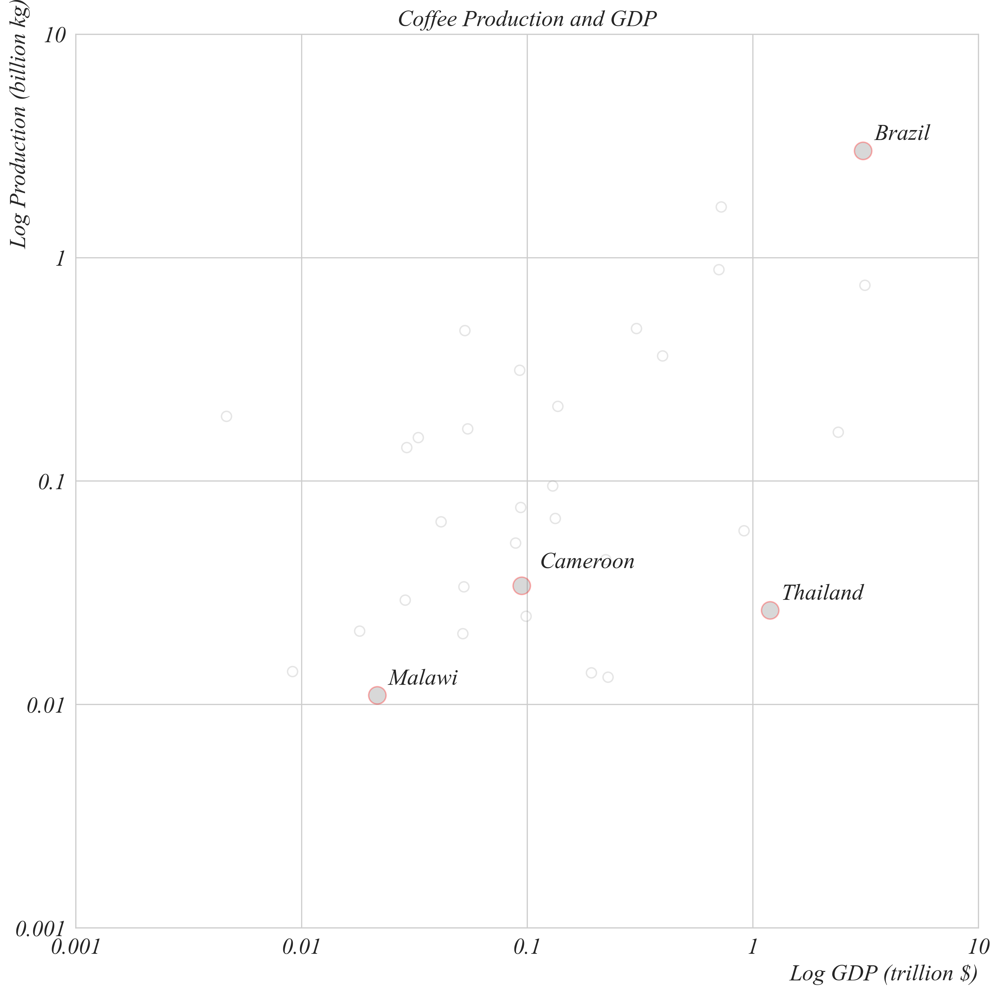

In [131]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

subset_list = ['BRA', 'THA', 'MWI', 'CMR']

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)
data['log10_Tonnes'] = np.log10(data['Tonnes'].replace(0, np.nan) + 1e-10)

other_data = data[~data.Code.isin(subset_list)]

plt.scatter(other_data['log10_GDP'], other_data['log10_Tonnes'], color='white', edgecolors='grey', alpha=0.2, s=50)

subset = data[data.Code.isin(subset_list)]

plt.scatter(subset['log10_GDP'], subset['log10_Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

for index, row in subset.iterrows():
    row_gdp = row.log10_GDP
    row_tonnes = row.log10_Tonnes
    row_entity = row.Entity
    if row_entity != 'Cameroon':
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))
    else:
        plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.08, row_tonnes+0.08))

plt.xlabel('Log GDP (trillion $)', loc='right')
x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Log Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
y_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
y_ticks = np.log10(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Production and GDP')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Subset_Log_Log.png')

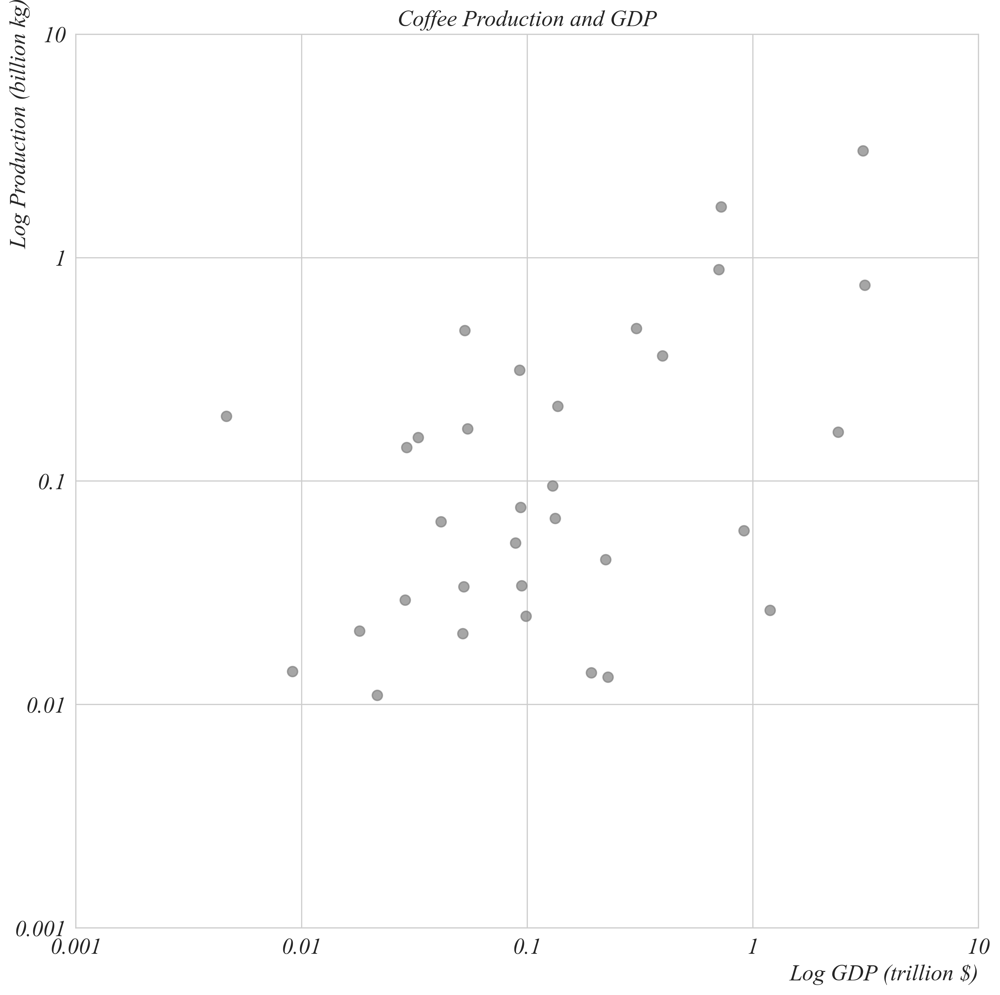

In [132]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)
data['log10_Tonnes'] = np.log10(data['Tonnes'].replace(0, np.nan) + 1e-10)

plt.scatter(data['log10_GDP'], data['log10_Tonnes'], color='grey', edgecolors='grey', alpha=0.7, s=50)

plt.xlabel('Log GDP (trillion $)', loc='right')
x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Log Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
y_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
y_ticks = np.log10(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Production and GDP')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Log_Log.png')

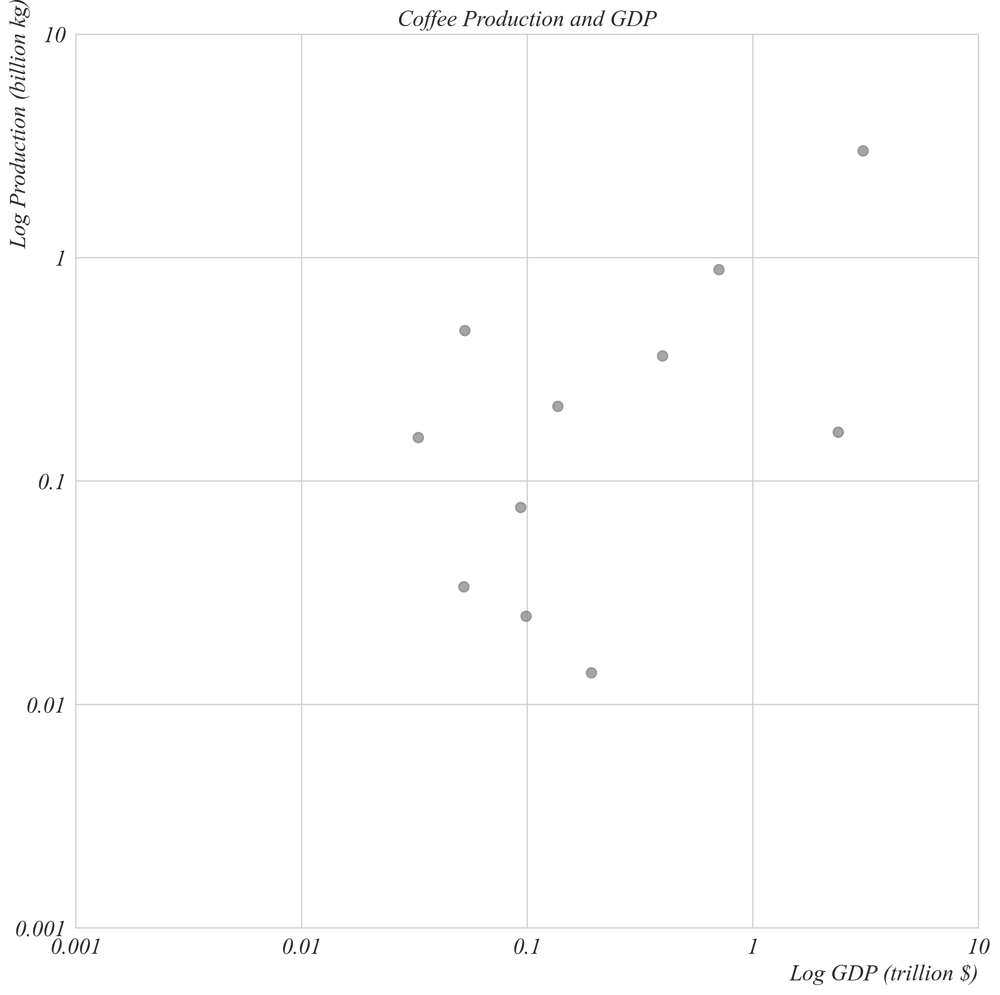

In [133]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)
data['log10_Tonnes'] = np.log10(data['Tonnes'].replace(0, np.nan) + 1e-10)

americas = ['Bolivia', 'Brazil', 'Colombia', 'Costa Rica', 'Dominican Republic', 'El Salvador', 'Guatemala',
       'Honduras', 'Mexico', 'Nicaragua', 'Peru']
america_data = data[data.Entity.isin(americas)]
plt.scatter(america_data['log10_GDP'], america_data['log10_Tonnes'], color='grey', edgecolors='grey', alpha=0.7, s=50)

plt.xlabel('Log GDP (trillion $)', loc='right')
x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Log Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
y_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
y_ticks = np.log10(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Production and GDP')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Log_Log_Americas.png')

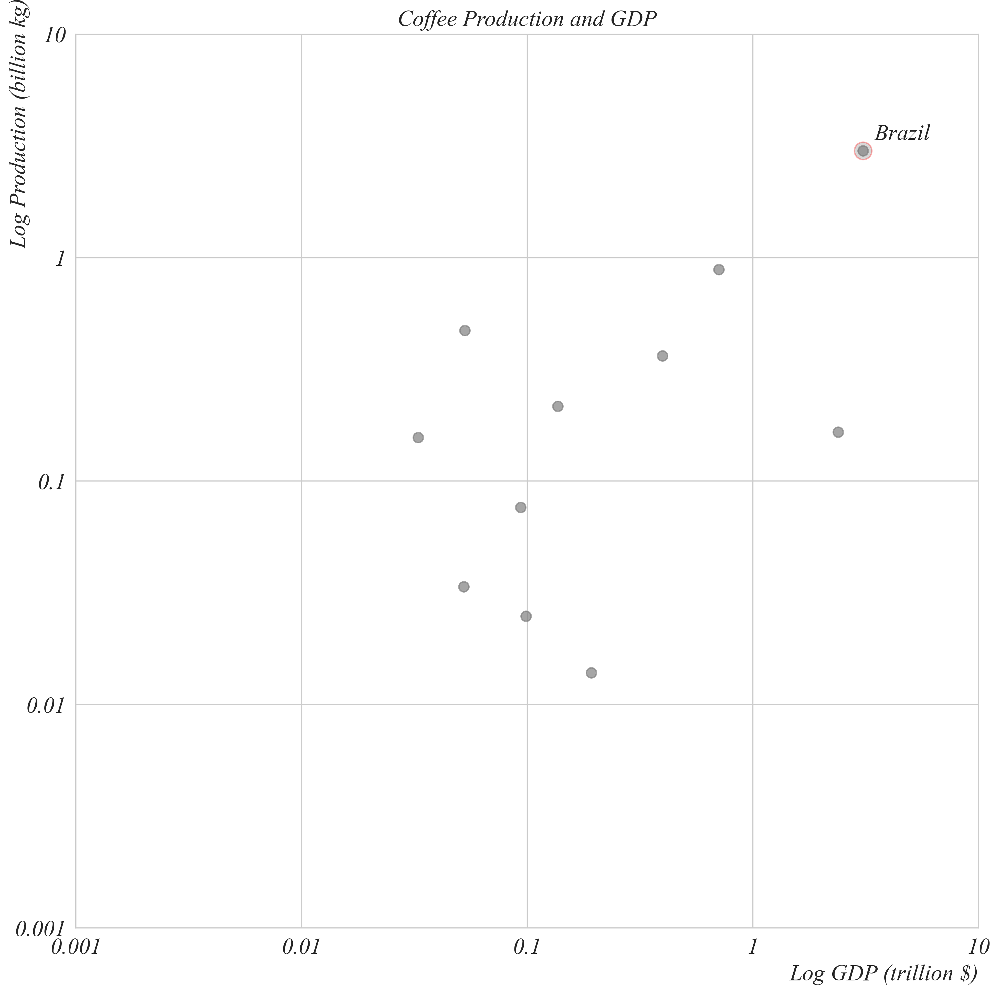

In [134]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)
data['log10_Tonnes'] = np.log10(data['Tonnes'].replace(0, np.nan) + 1e-10)

americas = ['Bolivia', 'Brazil', 'Colombia', 'Costa Rica', 'Dominican Republic', 'El Salvador', 'Guatemala',
       'Honduras', 'Mexico', 'Nicaragua', 'Peru']
america_data = data[data.Entity.isin(americas)]
plt.scatter(america_data['log10_GDP'], america_data['log10_Tonnes'], color='grey', edgecolors='grey', alpha=0.7, s=50)

america_max = america_data[america_data.log10_Tonnes == america_data.log10_Tonnes.max()]
plt.scatter(america_max['log10_GDP'], america_max['log10_Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

row_gdp = america_max.iloc[0].log10_GDP
row_tonnes = america_max.iloc[0].log10_Tonnes
row_entity = america_max.iloc[0].Entity

plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))

plt.xlabel('Log GDP (trillion $)', loc='right')
x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Log Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
y_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
y_ticks = np.log10(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Production and GDP')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Log_Log_Americas_Max.png')

/var/folders/v7/n92bbkrn50x_rhkvsgm29llc0000gn/T/ipykernel_28644/1547001756.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  america_data['GDP_dif'] = np.abs(america_data.log10_GDP - row_gdp)


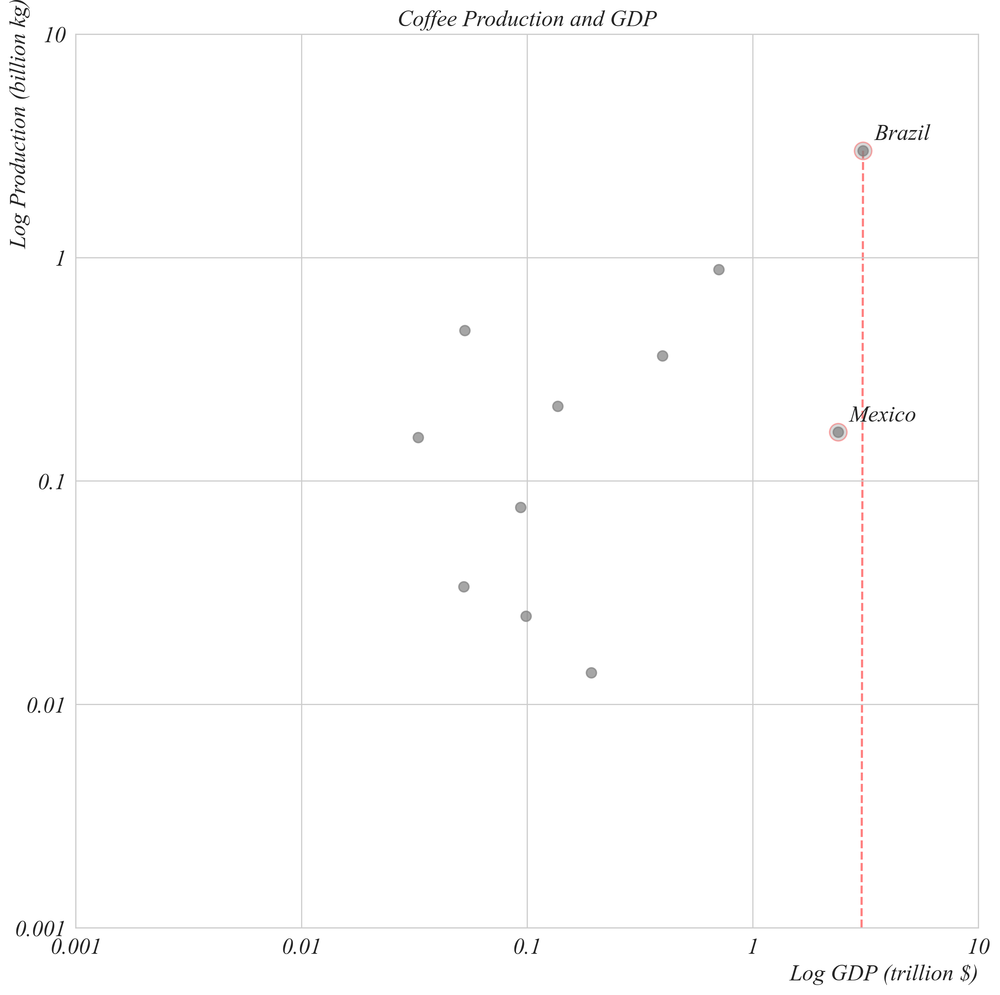

In [5]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

data = pd.read_csv('Data/Part_1_7_Beans_GDP.csv')
data = data[data['Year'] == 2019]
data['log10_GDP'] = np.log10(data['GDP'].replace(0, np.nan) + 1e-10)
data['log10_Tonnes'] = np.log10(data['Tonnes'].replace(0, np.nan) + 1e-10)

americas = ['Bolivia', 'Brazil', 'Colombia', 'Costa Rica', 'Dominican Republic', 'El Salvador', 'Guatemala',
       'Honduras', 'Mexico', 'Nicaragua', 'Peru']
america_data = data[data.Entity.isin(americas)]
plt.scatter(america_data['log10_GDP'], america_data['log10_Tonnes'], color='grey', edgecolors='grey', alpha=0.7, s=50)

america_max = america_data[america_data.log10_Tonnes == america_data.log10_Tonnes.max()]
plt.scatter(america_max['log10_GDP'], america_max['log10_Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

row_gdp = america_max.iloc[0].log10_GDP
row_tonnes = america_max.iloc[0].log10_Tonnes
row_entity = america_max.iloc[0].Entity

plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))

plt.plot([row_tonnes,row_gdp],[np.log(0.01),row_gdp], linestyle='--', color='red', zorder=-1, alpha=0.5)

america_data['GDP_dif'] = np.abs(america_data.log10_GDP - row_gdp)

america_dif_min = america_data[america_data['GDP_dif'] == america_data[america_data['GDP_dif'] >0]['GDP_dif'].min()]
plt.scatter(america_dif_min['log10_GDP'], america_dif_min['log10_Tonnes'], color='grey', edgecolors='red', alpha=0.3, s=150)

row_gdp = america_dif_min.iloc[0].log10_GDP
row_tonnes = america_dif_min.iloc[0].log10_Tonnes
row_entity = america_dif_min.iloc[0].Entity

plt.annotate(row_entity,(row_gdp, row_tonnes),xytext=(row_gdp+0.05, row_tonnes+0.05))

plt.xlabel('Log GDP (trillion $)', loc='right')

x_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
x_ticks = np.log10(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Log Production (billion kg)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .9)
y_ticks_labels = [0.001, 0.01, 0.1, 1, 10]
y_ticks = np.log10(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.ylim(y_ticks.min(),y_ticks.max())
plt.title('Coffee Production and GDP')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Beans_GDP_Scatter_Log_Log_Americas_Max_Nearest.png')

## Coffee Consumption

In [138]:
coffee = pd.read_csv('Data/Part_1_7_Coffee_Consumption/Coffee_importers_consumption.csv')
population = pd.read_csv('Data/Part_1_7_Population_By_Country/population.csv')
population.rename(columns={'Country Name':'Country', 'Country Code': 'Code'}, inplace=True)
pre_cap = coffee.merge(population, on='Code', how='inner')
years = ['1990', '1991', '1992', '1993', '1994', '1995', '1996',
       '1997', '1998', '1999', '2000', '2001', '2002', '2003', '2004',
       '2005', '2006', '2007', '2008', '2009', '2010', '2011', '2012',
       '2013', '2014', '2015', '2016', '2017', '2018', '2019']
percap = pd.DataFrame(pre_cap['Code'].values, columns=['Code'])
for year in years:
    percap[year] = pre_cap[year+'_x']/pre_cap[year+'_y']
percap = percap[percap['Code'] != 'BEL']
y_loc=0.5
percap['jitter'] = [y_loc-0.1] * len(percap) + np.random.rand(len(percap))*0.2

percap.to_csv('Data/Part_1_7_Coffee_Per_Cap.csv')

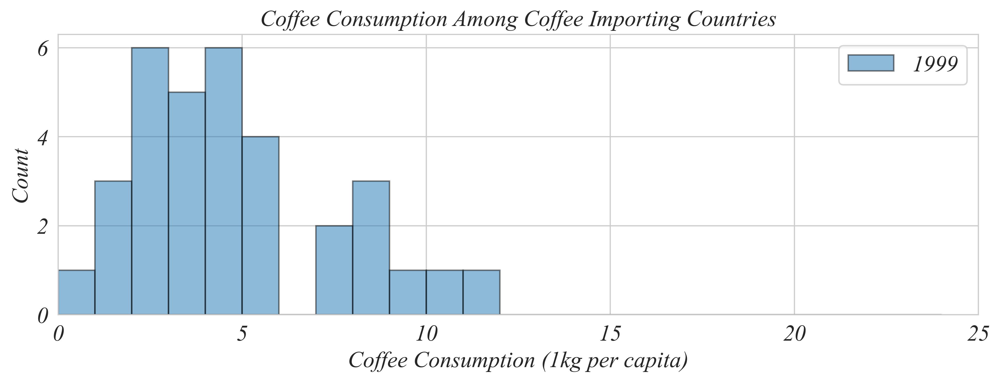

In [6]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

bin_edges = np.arange(0, 25, 1)

close_counts, bin_edges, patches = plt.hist(percap['1999'], bins=bin_edges, edgecolor='black', label = '1999', alpha=1/2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.legend()
plt.ylabel('Count')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.xlim(0,25)
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_1999.png')

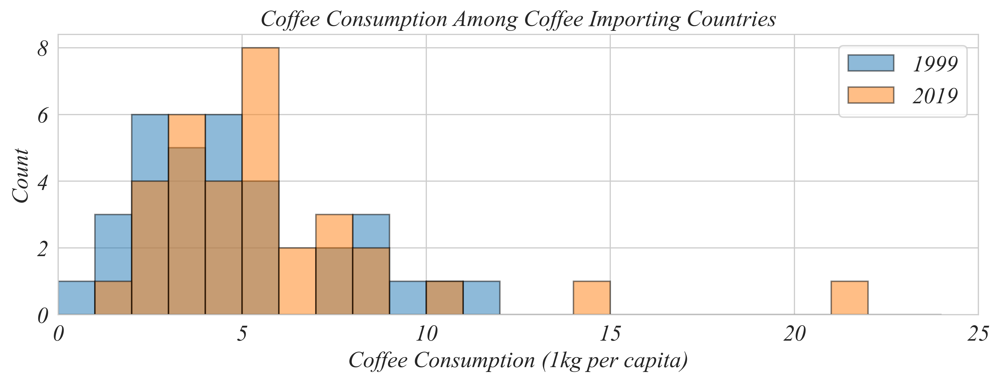

In [143]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

bin_edges = np.arange(0, 25, 1)

close_counts, bin_edges, patches = plt.hist(percap['1999'], bins=bin_edges, edgecolor='black', label = '1999', alpha=1/2)
open_counts, bin_edges, patches = plt.hist(percap['2019'], bins=bin_edges, edgecolor='black', label = '2019', alpha=1/2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.legend()
plt.ylabel('Count')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.xlim(0,25)
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_1999_2019.png')

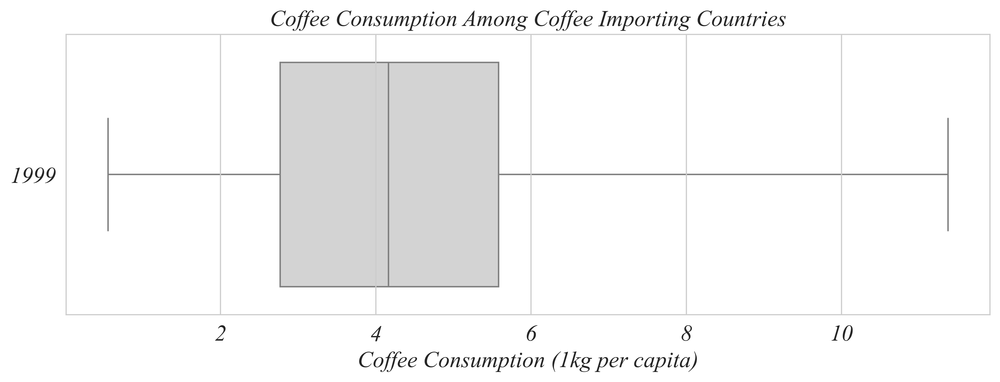

In [144]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)
percap_melted = percap[['1999']].melt(var_name='Year', value_name='Value')

ax = sns.boxplot(x='Value', y='Year', color='lightgrey', data=percap_melted, whis=(0, 100), zorder=-2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Basic.png')


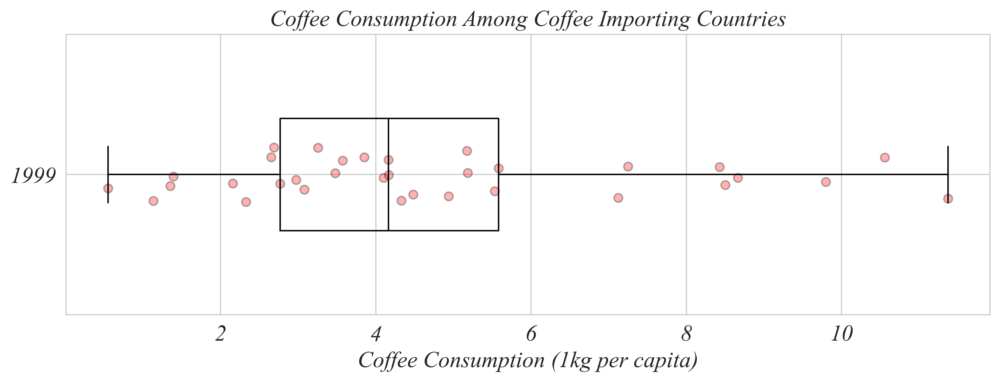

In [145]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='red', edgecolor='black', alpha=0.3)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999.png')

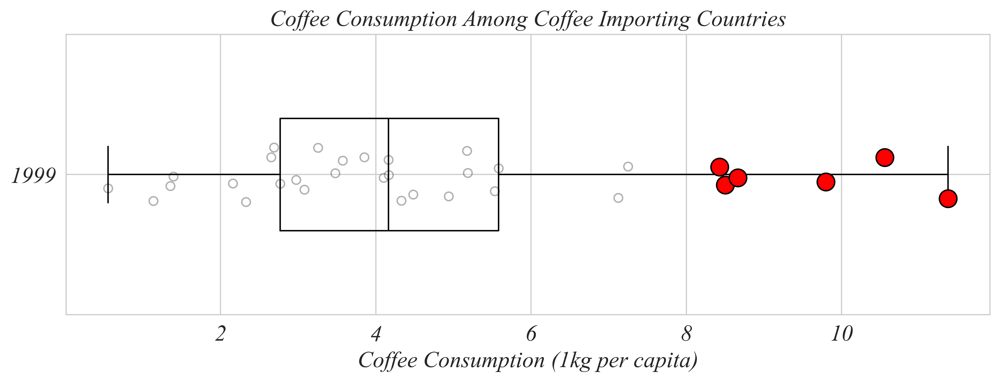

In [146]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)
y_loc = 0.5

plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] >= 8]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Large.png')

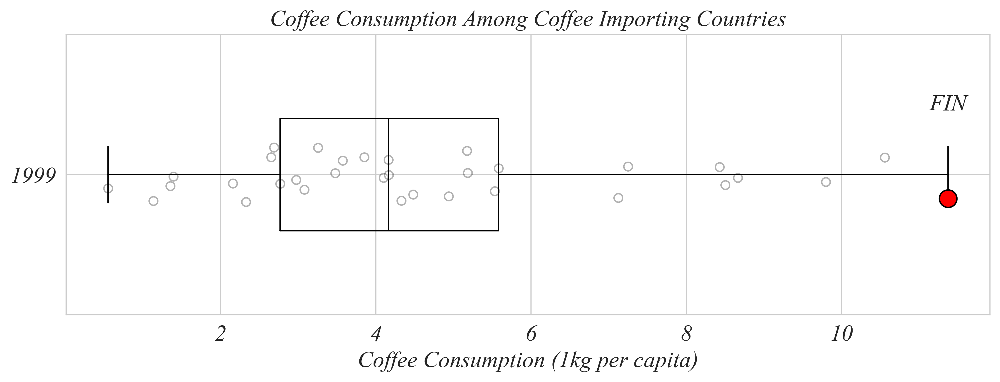

In [8]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] == percap['1999'].max()]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

max_val = percap_max['1999'].max()
max_val_name = percap_max.Code.iloc[0]
plt.annotate(max_val_name, (max_val, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Max.png')

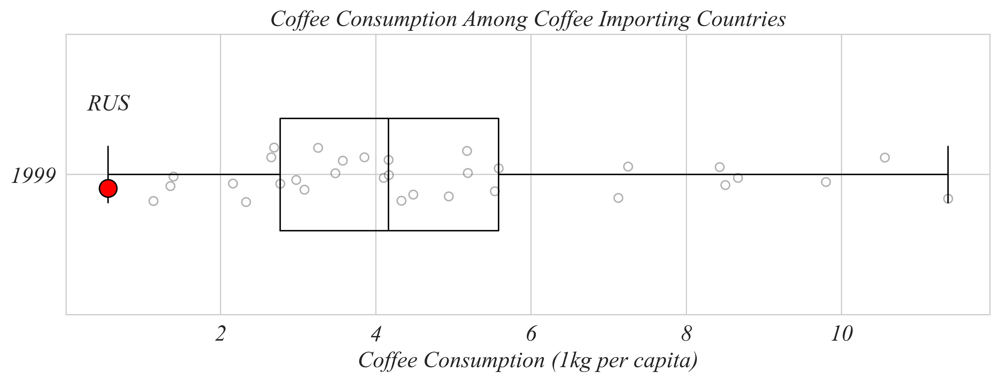

In [9]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] == percap['1999'].min()]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

max_val = percap_max['1999'].min()
max_val_name = percap_max.Code.iloc[0]
plt.annotate(max_val_name, (max_val, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Min.png')

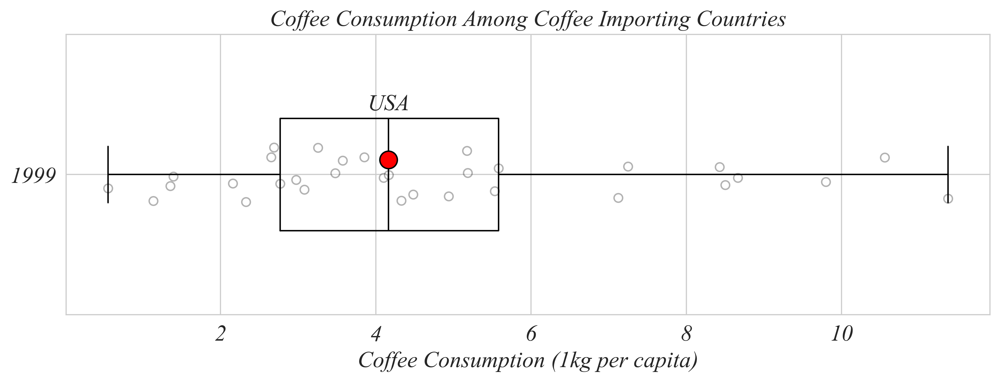

In [10]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] == percap['1999'].median()]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

max_val = percap_max['1999'].median()
max_val_name = percap_max.Code.iloc[0]
plt.annotate(max_val_name, (max_val, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Median.png')

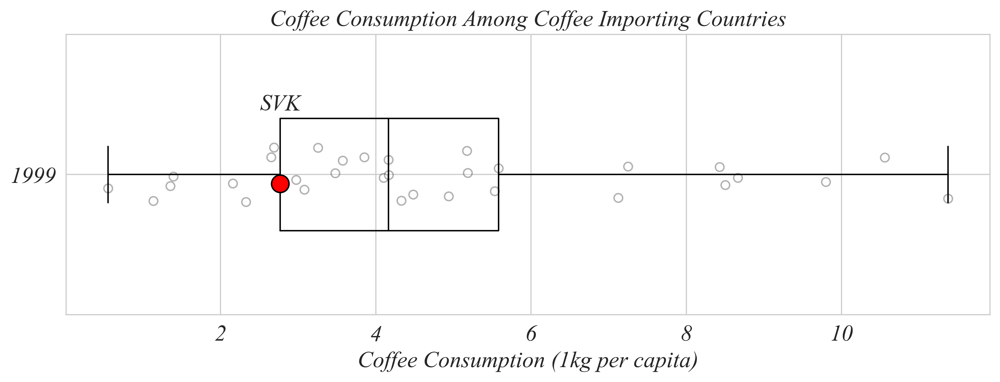

In [11]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] == percap['1999'].quantile(0.25)]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

max_val = percap_max['1999'].quantile(0.25)
max_val_name = percap_max.Code.iloc[0]
plt.annotate(max_val_name, (max_val, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Q1.png')

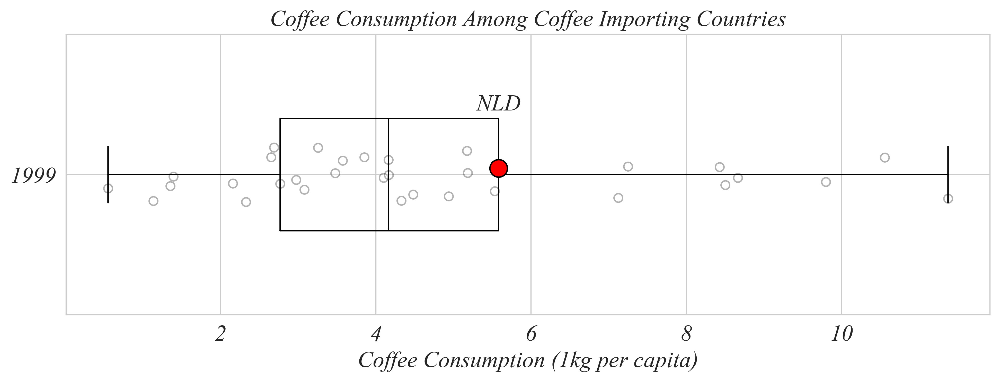

In [13]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

percap_max = percap[percap['1999'] == percap['1999'].quantile(0.75)]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

max_val = percap_max['1999'].quantile(0.75)
max_val_name = percap_max.Code.iloc[0]
plt.annotate(max_val_name, (max_val, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_Q3.png')

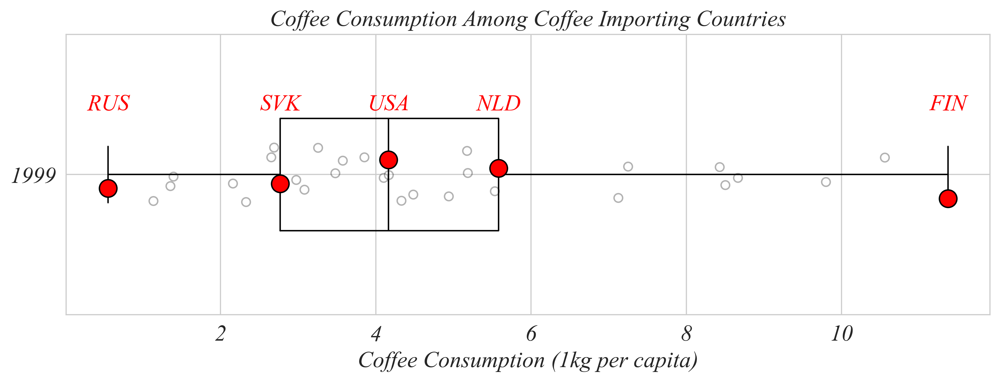

In [14]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

quantiles = [percap['1999'].min(), percap['1999'].quantile(0.25),percap['1999'].median(), percap['1999'].quantile(0.75), percap['1999'].max()]
percap_max = percap[percap['1999'].isin(quantiles)]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

for i,row in percap_max.iterrows():
    value = row['1999']
    max_val_name = row.Code
    plt.annotate(max_val_name, (value, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2, color='red')

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_IQR.png')

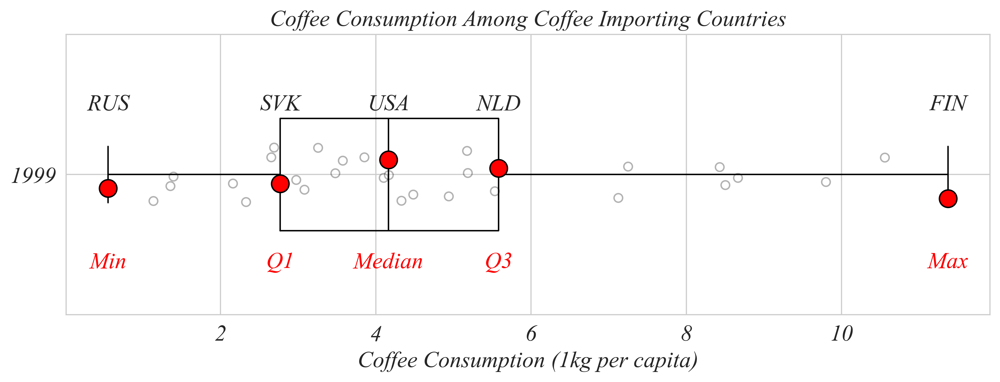

In [15]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=4)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

y_loc = 0.5
plt.boxplot(percap['1999'], vert=False, positions=[y_loc], widths=0.4, whis=(0, 100),
            whiskerprops=dict(color='black'),
            capprops=dict(color='black'),
            medianprops=dict(color='black', linewidth=1),
            flierprops=dict(markerfacecolor='black', marker='o', markersize=5, linestyle='none'))

plt.scatter(percap['1999'], percap['jitter'], color='white', edgecolor='black', alpha=0.3)

quantile_names = ['Min', 'Q1', 'Median', 'Q3', 'Max']
quantiles = [percap['1999'].min(), percap['1999'].quantile(0.25),percap['1999'].median(), percap['1999'].quantile(0.75), percap['1999'].max()]
percap_max = percap[percap['1999'].isin(quantiles)]
plt.scatter(percap_max['1999'], percap_max['jitter'], color='red', edgecolor='black', alpha=1, s=150, zorder=3)

for i,row in percap_max.iterrows():
    value = row['1999']
    max_val_name = row.Code
    plt.annotate(max_val_name, (value, y_loc+3/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2)

for q_name, value in zip(quantile_names, quantiles):
    plt.annotate(q_name, (value, y_loc-6/16), textcoords="offset points", xytext=(0,5), va='bottom', ha='center', zorder=2, color='red')

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.ylabel('')
plt.xlabel('Coffee Consumption (1kg per capita)')
plt.yticks([y_loc], ['1999'])
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_IQR_Labels.png')

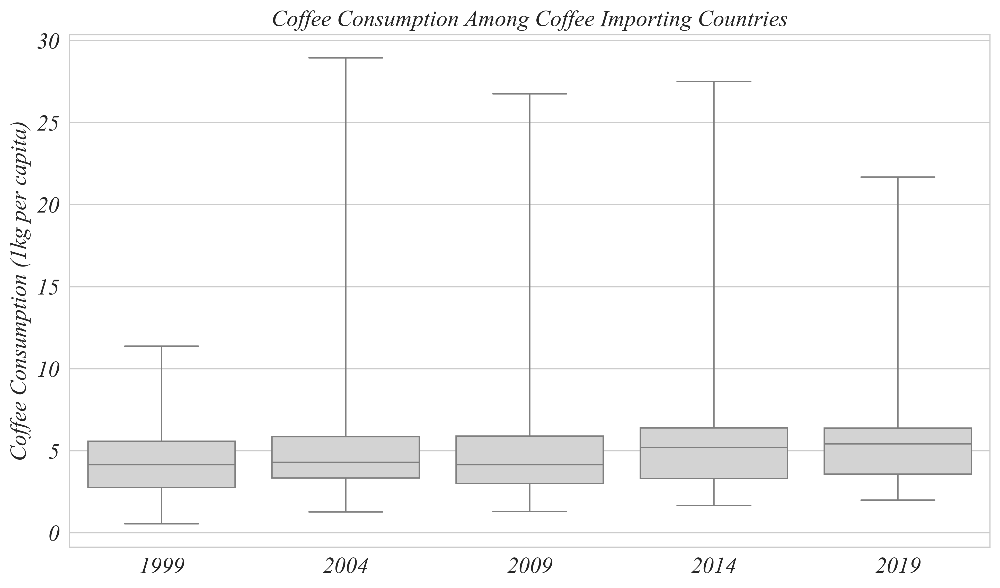

In [17]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')

ax = sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=2)
plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019.png')


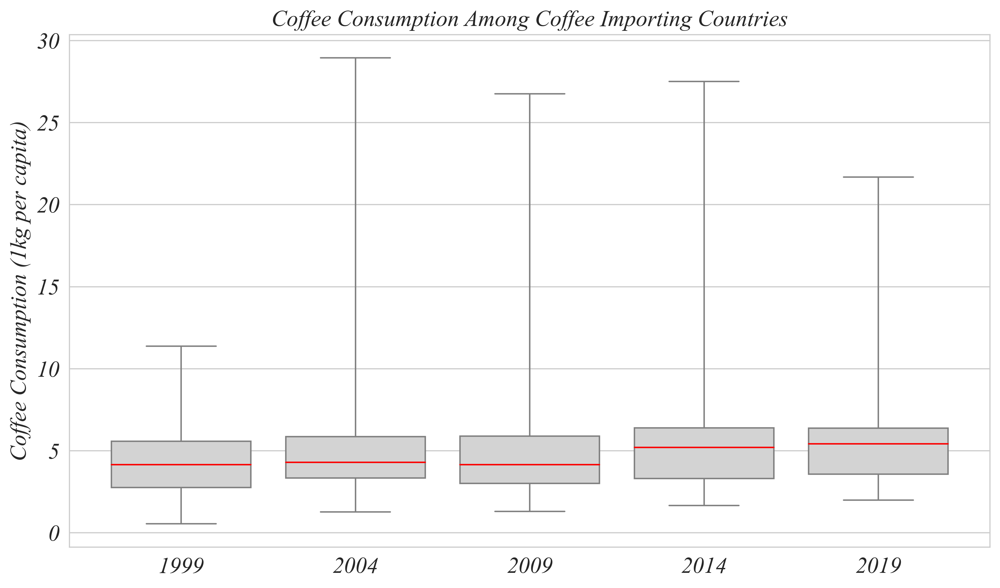

In [18]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=2)

medians = percap_melted.groupby('Year')['Value'].median()
for i, median in enumerate(medians):
    plt.plot([i - 0.4, i + 0.4], [median, median], color='red', linewidth=1, zorder=4)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Medians.png')


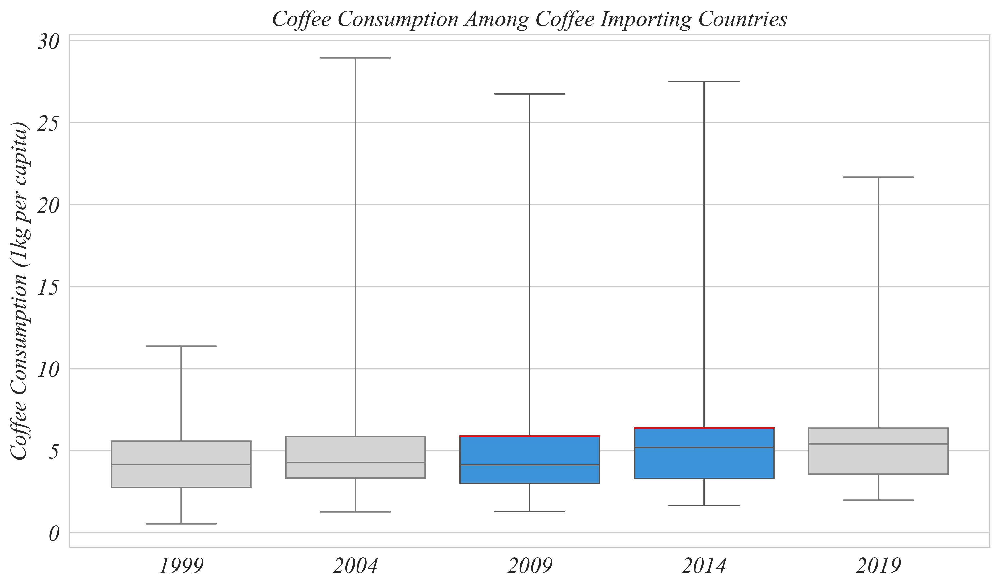

In [22]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=1)

percap_melted = percap[['2009','2014']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='#2196F3',data=percap_melted, whis=(0, 100), zorder=1)

medians = percap_melted.groupby('Year')['Value'].quantile(0.75)
for i, median in enumerate(medians):
    plt.plot([2+i - 0.4, 2+i + 0.4], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Median_Jump.png')


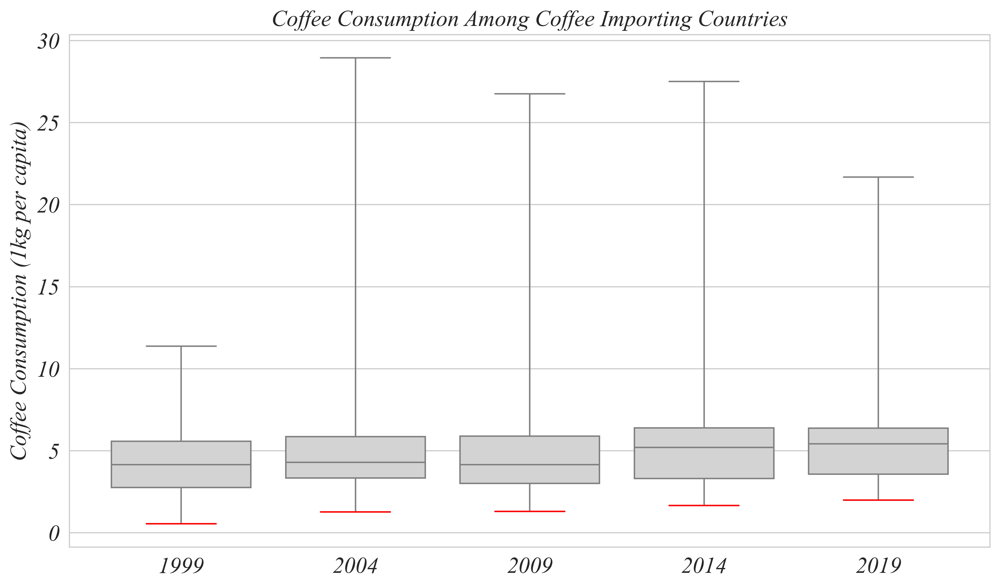

In [23]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=2)

medians = percap_melted.groupby('Year')['Value'].min()
for i, median in enumerate(medians):
    plt.plot([i - 0.2, i + 0.2], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Minimum.png')


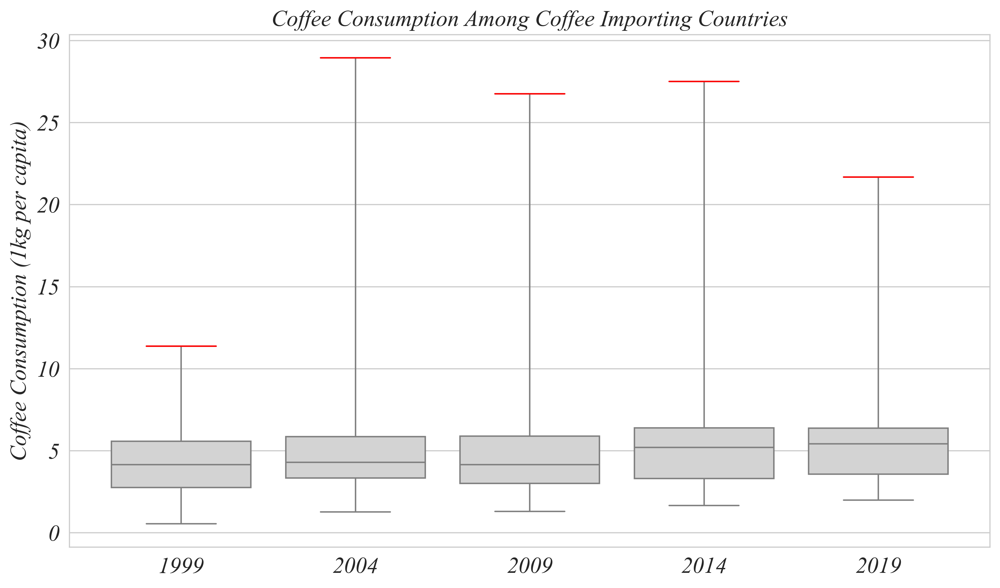

In [24]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=2)

medians = percap_melted.groupby('Year')['Value'].max()
for i, median in enumerate(medians):
    plt.plot([i - 0.2, i + 0.2], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Maximum.png')


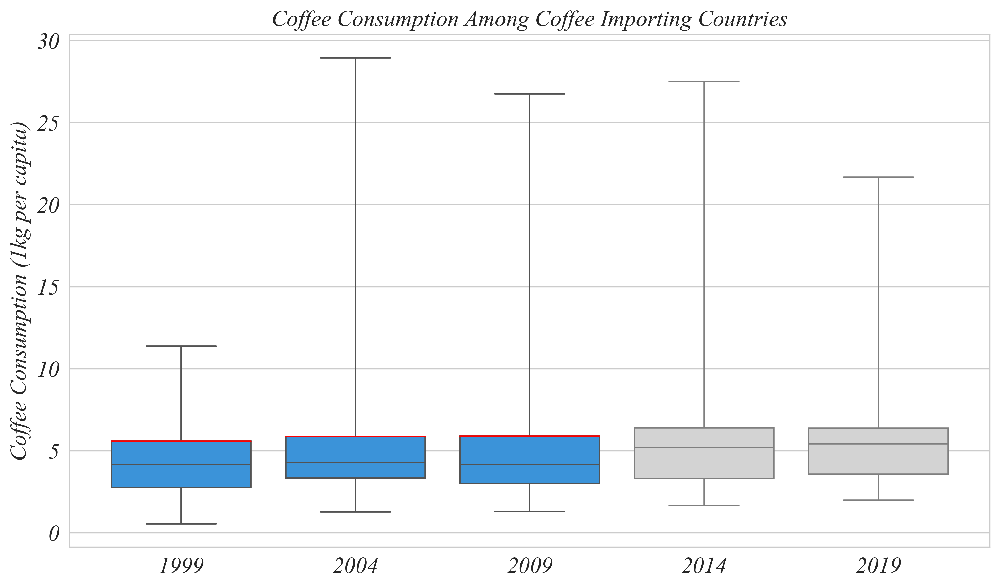

In [25]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=1)

percap_melted = percap[['1999','2004','2009']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='#2196F3',data=percap_melted, whis=(0, 100), zorder=1)

medians = percap_melted.groupby('Year')['Value'].quantile(0.75)
for i, median in enumerate(medians):
    plt.plot([i - 0.4, i + 0.4], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()

plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Less_Than_5.png')


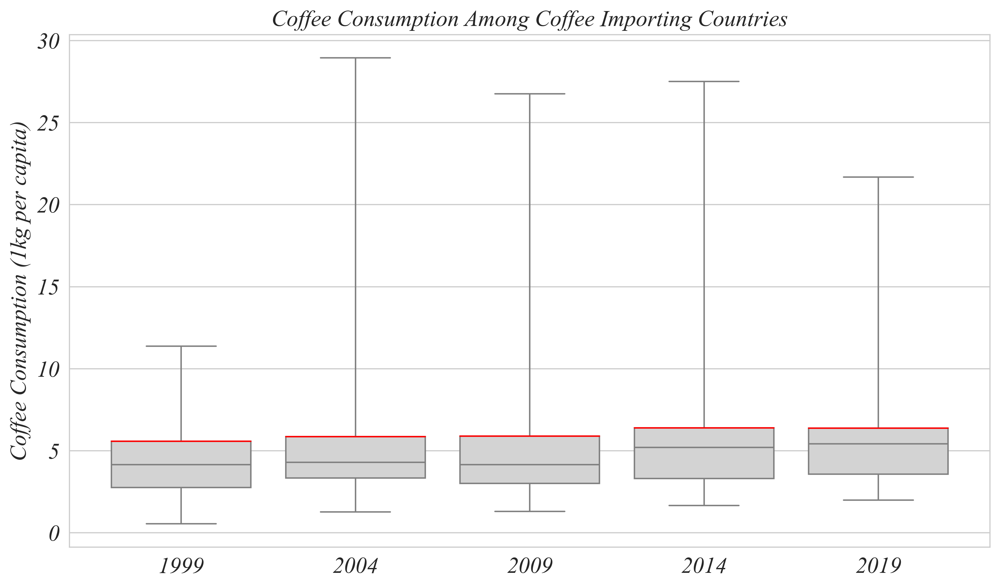

In [26]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=2)

medians = percap_melted.groupby('Year')['Value'].quantile(0.75)
for i, median in enumerate(medians):
    plt.plot([i - 0.4, i + 0.4], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Q3.png')


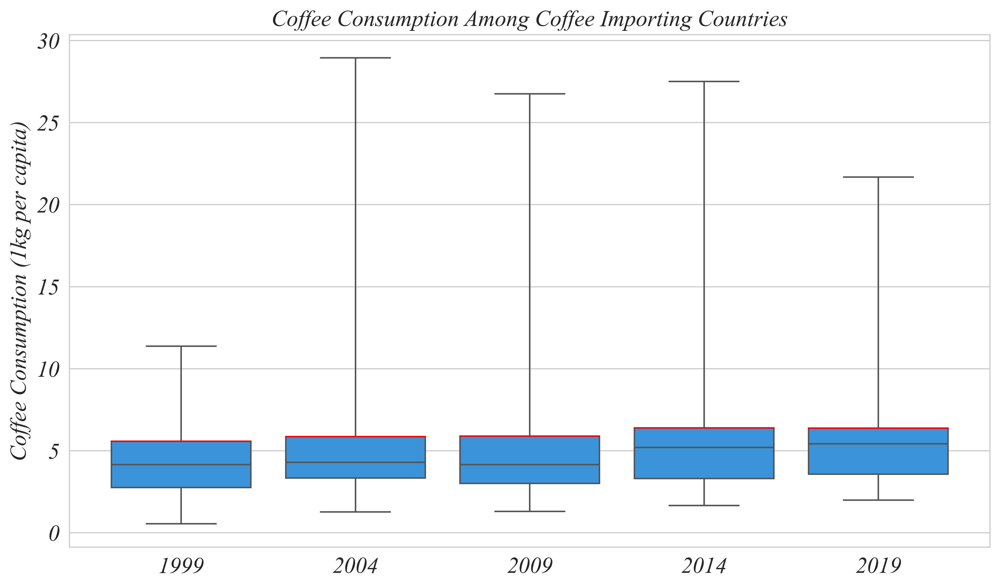

In [27]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=1)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='#2196F3',data=percap_melted, whis=(0, 100), zorder=1)

medians = percap_melted.groupby('Year')['Value'].quantile(0.75)
for i, median in enumerate(medians):
    plt.plot([i - 0.4, i + 0.4], [median, median], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_More_Than_5.png')


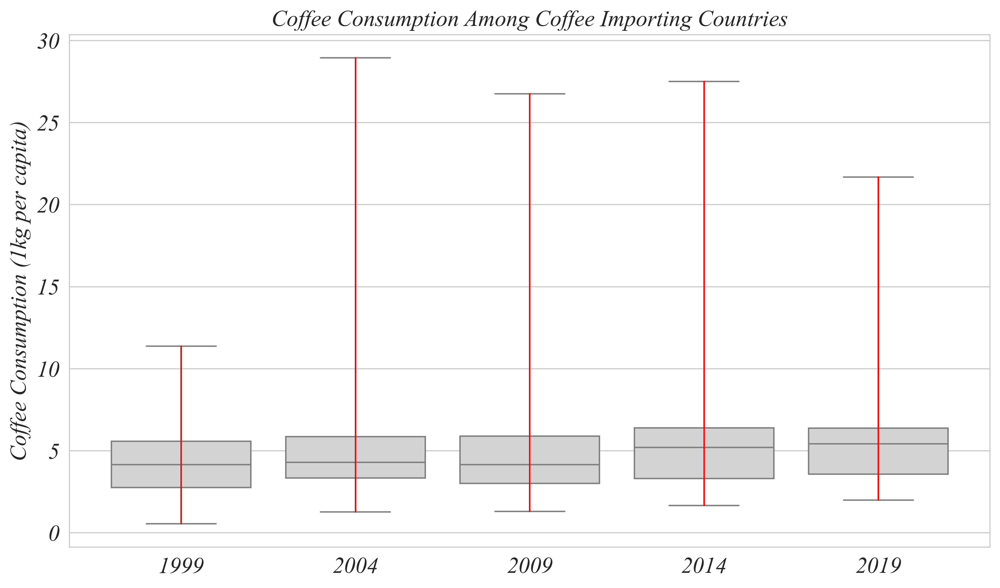

In [28]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=1)

mins = percap_melted.groupby('Year')['Value'].min()
maxes = percap_melted.groupby('Year')['Value'].max()
for i, (min,max) in enumerate(zip(mins,maxes)):
    plt.plot([i, i], [min, max], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Range.png')


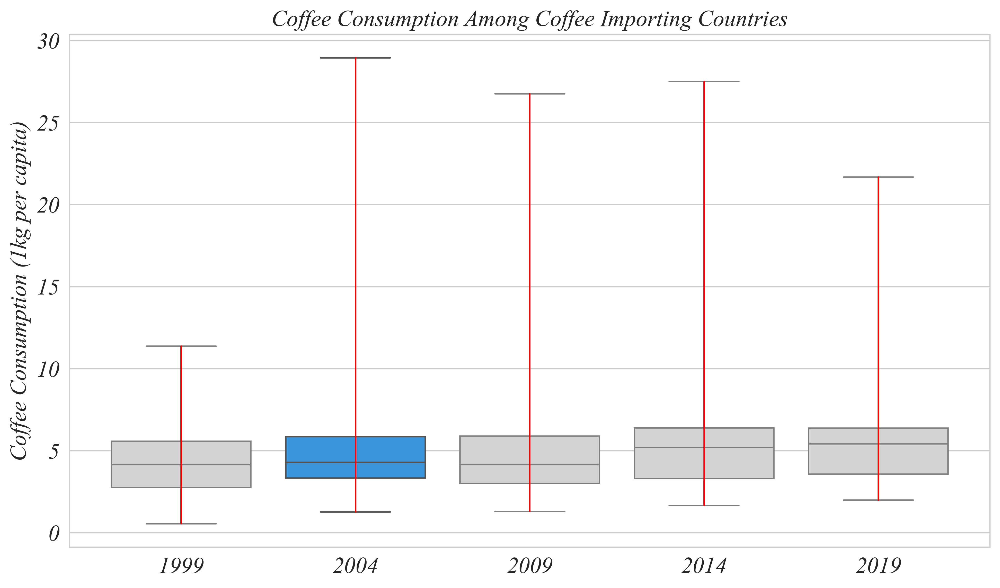

In [30]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=6)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

percap_melted = percap[['1999','2004','2009','2014','2019']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='lightgrey',data=percap_melted, whis=(0, 100), zorder=1)

mins = percap_melted.groupby('Year')['Value'].min()
maxes = percap_melted.groupby('Year')['Value'].max()

percap_melted = percap[['2004']].melt(var_name='Year', value_name='Value')
sns.boxplot(x='Year', y='Value', color='#2196F3',data=percap_melted, whis=(0, 100), zorder=1)

for i, (min,max) in enumerate(zip(mins,maxes)):
    plt.plot([i, i], [min, max], color='red', linewidth=1)

plt.title('Coffee Consumption Among Coffee Importing Countries')
plt.xlabel('')
plt.ylabel('Coffee Consumption (1kg per capita)')
plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Box_1999_2019_Max_Range.png')


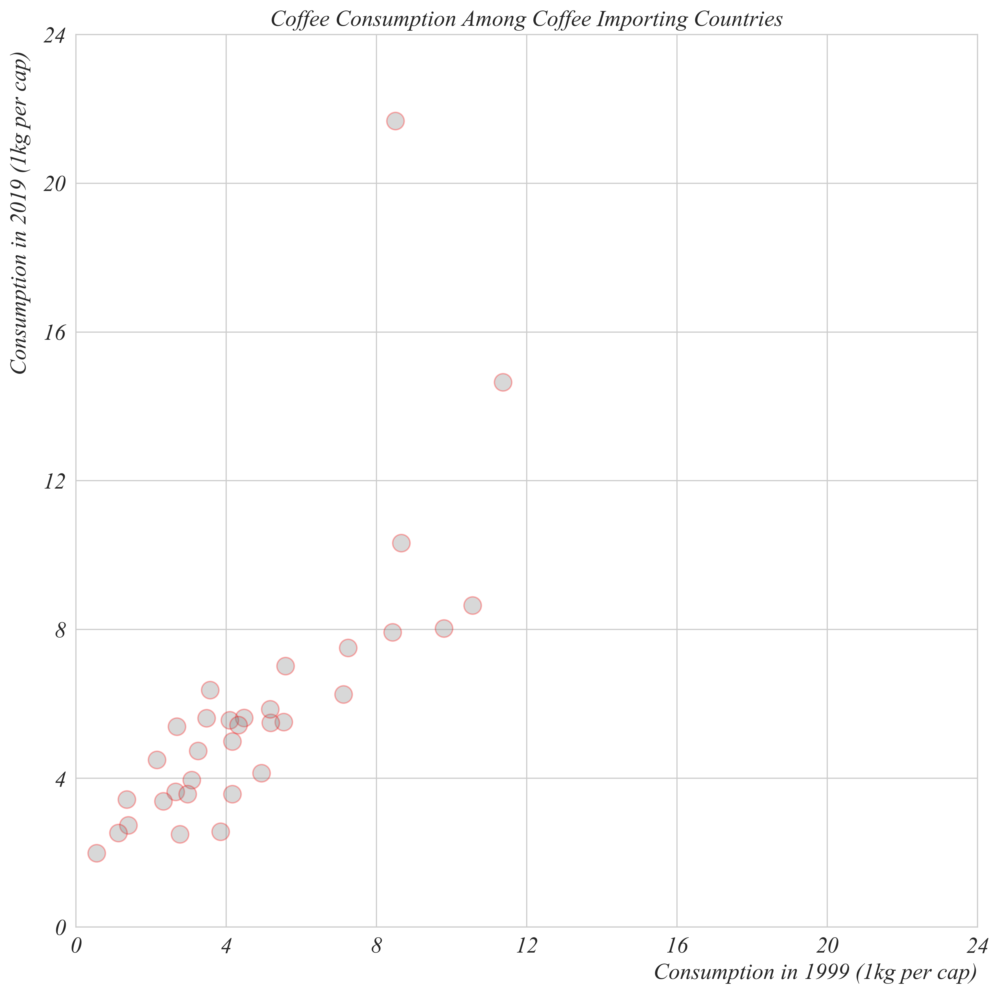

In [32]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

plt.scatter(percap['1999'], percap['2019'], color='grey', edgecolors='red', alpha=0.3, s=150)

plt.xlabel('Consumption in 1999 (1kg per cap)', loc='right')
x_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
x_ticks = x_ticks_labels
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Consumption in 2019 (1kg per cap)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .8)
y_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
y_ticks = y_ticks_labels
plt.xlim(0,24)
plt.ylim(0,24)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Consumption Among Coffee Importing Countries')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Scatter_1999_2019.png')


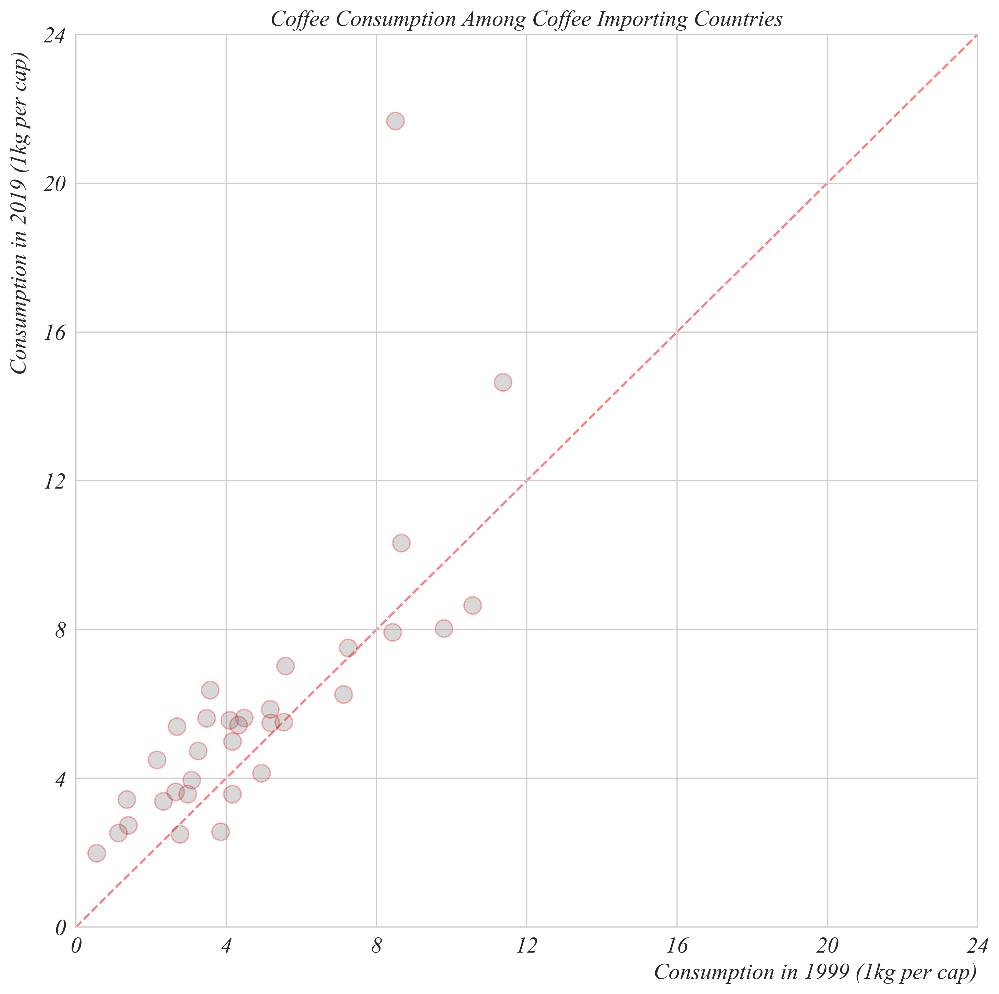

In [33]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)
percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)

plt.scatter(percap['1999'], percap['2019'], color='grey', edgecolors='red', alpha=0.3, s=150)
plt.plot([0,24],[0,24], linestyle='--', color='red', zorder=-1, alpha=0.5)

plt.xlabel('Consumption in 1999 (1kg per cap)', loc='right')
x_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
x_ticks = x_ticks_labels
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Consumption in 2019 (1kg per cap)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .8)
y_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
y_ticks = y_ticks_labels
plt.xlim(0,24)
plt.ylim(0,24)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Consumption Among Coffee Importing Countries')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Scatter_1999_2019_45.png')


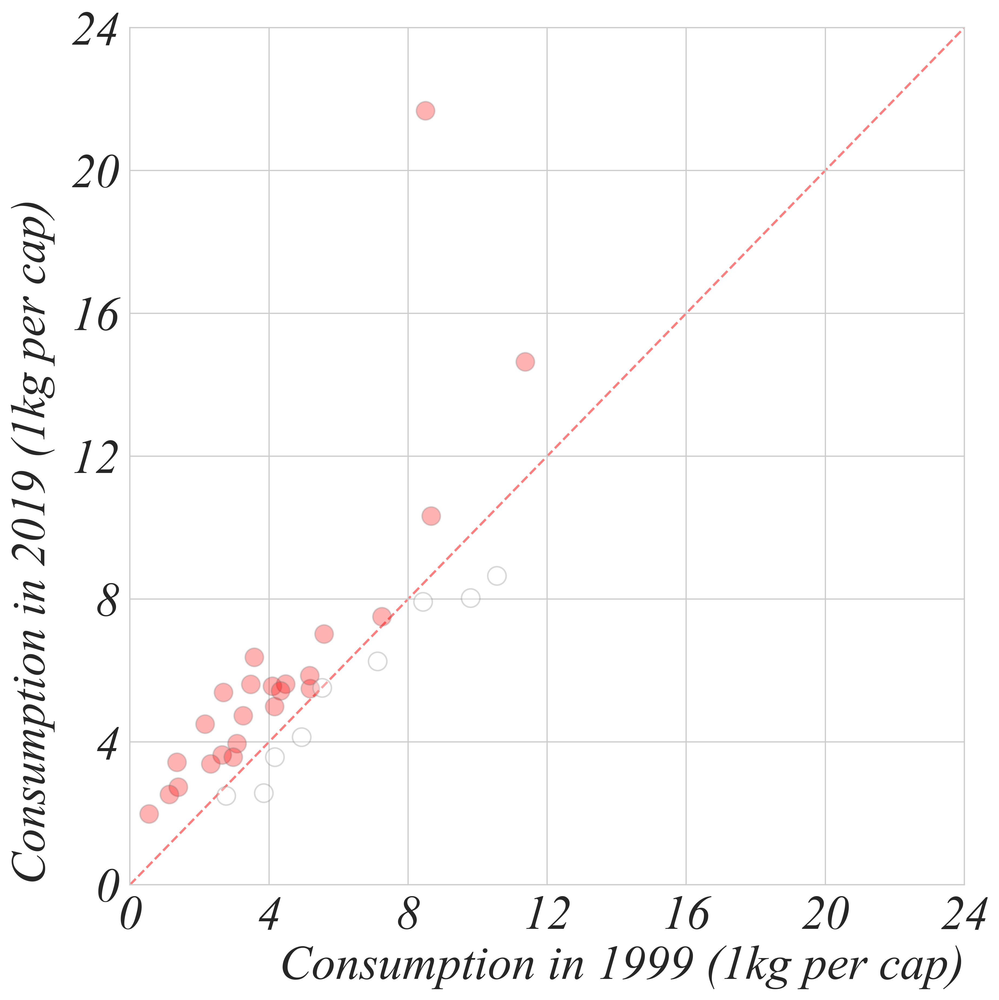

In [17]:
from Weidman_Figures import *

# Update Matplotlib parameters
plt.rcParams.update({
    'font.family': 'serif',              # Set the font family
    'font.serif': ['Times New Roman'],   # Use a specific serif font
    'font.size': 32,                     # Set the general font size
    'axes.titlesize': 40,                # Set the font size of the title
    'axes.labelsize': 32,                # Set the font size of axis labels
    'font.style': 'italic',              # Set the font style to italic
    'figure.dpi': 400   
})
    
fig, ax = Weid_Fig(height=10)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)
increase = percap[percap['1999'] <= percap['2019']]
decrease = percap[percap['1999'] > percap['2019']]

plt.scatter(increase['1999'], increase['2019'], color='red', edgecolors='grey', alpha=0.3, s=150)
plt.scatter(decrease['1999'], decrease['2019'], color='white', edgecolors='grey', alpha=0.3, s=150)

plt.plot([0,24],[0,24], linestyle='--', color='red', zorder=-1, alpha=0.5)

plt.xlabel('Consumption in 1999 (1kg per cap)', loc='right')
x_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
x_ticks = x_ticks_labels
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Consumption in 2019 (1kg per cap)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.09, .4)
y_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
y_ticks = y_ticks_labels
plt.xlim(0,24)
plt.ylim(0,24)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
#plt.title('Coffee Importing Countries', pad = 50)

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Scatter_1999_2019_45_Increase.png')


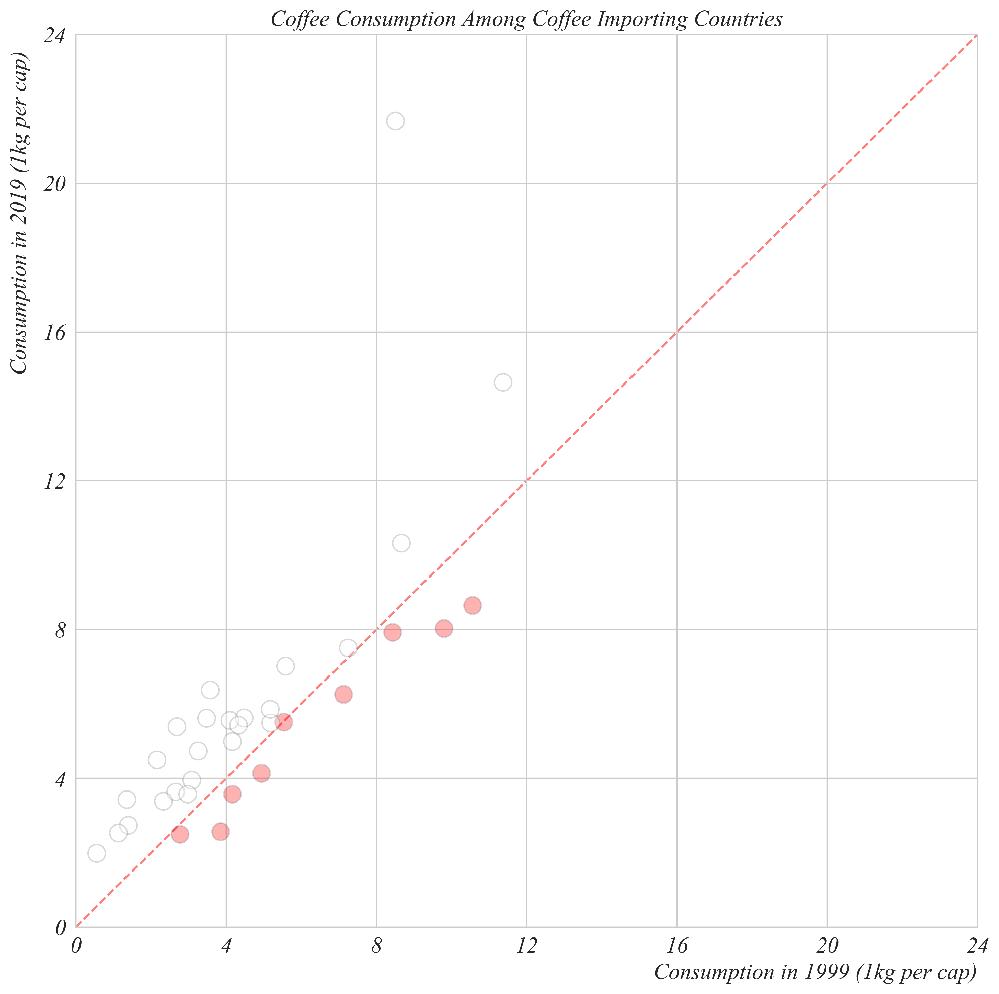

In [35]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)
increase = percap[percap['1999'] <= percap['2019']]
decrease = percap[percap['1999'] > percap['2019']]

plt.scatter(decrease['1999'], decrease['2019'], color='red', edgecolors='grey', alpha=0.3, s=150)
plt.scatter(increase['1999'], increase['2019'], color='white', edgecolors='grey', alpha=0.3, s=150)

plt.plot([0,24],[0,24], linestyle='--', color='red', zorder=-1, alpha=0.5)

plt.xlabel('Consumption in 1999 (1kg per cap)', loc='right')
x_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
x_ticks = x_ticks_labels
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Consumption in 2019 (1kg per cap)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .8)
y_ticks_labels = [0, 4, 8, 12, 16, 20, 24]
y_ticks = y_ticks_labels
plt.xlim(0,24)
plt.ylim(0,24)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.title('Coffee Consumption Among Coffee Importing Countries')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Scatter_1999_2019_45_Decrease.png')


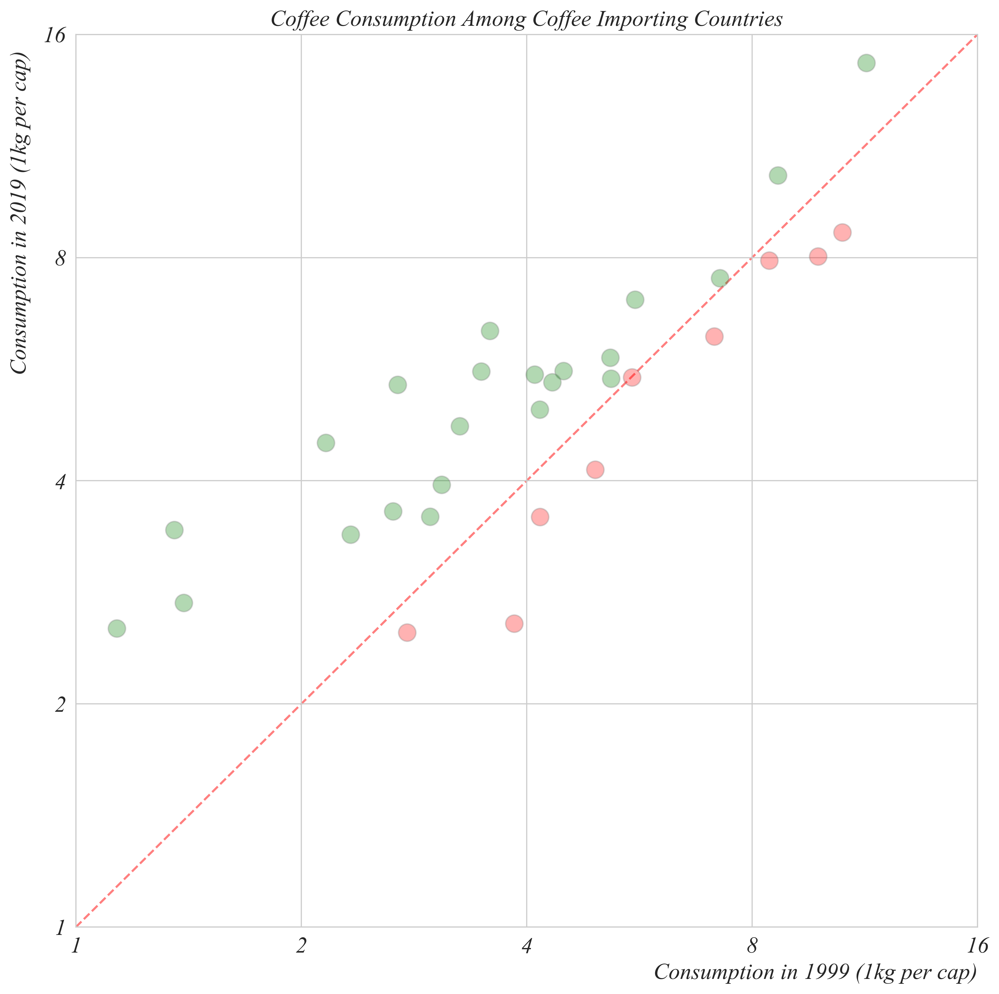

In [36]:
from Weidman_Figures import *
    
fig, ax = Weid_Fig(height=10)

percap = pd.read_csv('Data/Part_1_7_Coffee_Per_Cap.csv', index_col=0)
percap['log10_1999'] = np.log2(percap['1999'].replace(0, np.nan) + 1e-10)
percap['log10_2019'] = np.log2(percap['2019'].replace(0, np.nan) + 1e-10)

increase = percap[percap['1999'] <= percap['2019']]
decrease = percap[percap['1999'] > percap['2019']]

plt.scatter(decrease['log10_1999'], decrease['log10_2019'], color='red', edgecolors='grey', alpha=0.3, s=150)
plt.scatter(increase['log10_1999'], increase['log10_2019'], color='green', edgecolors='grey', alpha=0.3, s=150)

plt.plot([0,24],[0,24], linestyle='--', color='red', zorder=-1, alpha=0.5)

plt.xlabel('Consumption in 1999 (1kg per cap)', loc='right')
x_ticks_labels = [1,2,4,8,16]
x_ticks = np.log2(x_ticks_labels)
plt.xticks(ticks=x_ticks, labels=x_ticks_labels)
plt.ylabel('Consumption in 2019 (1kg per cap)')
ax = plt.gca()
ax.yaxis.set_label_coords(-0.05, .8)
y_ticks_labels = [1,2,4,8,16]
y_ticks = np.log2(y_ticks_labels)
plt.yticks(ticks=y_ticks, labels=y_ticks_labels)
plt.xlim(np.log2(1),np.log2(16))
plt.ylim(np.log2(1),np.log2(16))
plt.title('Coffee Consumption Among Coffee Importing Countries')

plt.tight_layout()
plt.savefig('Figures/Part_1_7_Coffee_Per_Cap_Scatter_1999_2019_45_Log.png')
